In [1]:
from typing import Dict,Callable

from tempfile import gettempdir
import matplotlib.pyplot as plt
import numpy as np

import torch
from torch import optim,Tensor,unsqueeze
from torch.utils.data import DataLoader
from torch.utils.data.dataset import Dataset
import torch.autograd
import torch.nn as nn
from torchvision.models.resnet import resnet50,resnet18
import torchvision.transforms as transforms
from torchvision import datasets
from torchvision.utils import save_image
import torch.nn.functional as F

from mydataset import MyTrainDataset, my_dataset_worker_init_func

from tqdm import tqdm

from l5kit.configs import load_config_data
from l5kit.data import LocalDataManager, ChunkedDataset
from l5kit.dataset import AgentDataset, EgoDataset
from l5kit.rasterization import build_rasterizer
from l5kit.evaluation import write_pred_csv, compute_metrics_csv, write_gt_csv, read_gt_csv
from l5kit.evaluation.chop_dataset import MIN_FUTURE_STEPS
from l5kit.evaluation.metrics import neg_multi_log_likelihood, time_displace, average_displacement_error_mean, final_displacement_error_mean
from l5kit.geometry import transform_points
from l5kit.visualization import PREDICTED_POINTS_COLOR, TARGET_POINTS_COLOR, draw_trajectory
from prettytable import PrettyTable
from pathlib import Path

import os
os.environ["KMP_DUPLICATE_LIB_OK"]="True"

D:\anaconda3\envs\stgm\lib\site-packages\l5kit\dataset\select_agents.py:32: UserWarning: Windows detected. BLOSC_NOLOCK has not been set as it causes memory leaks on Windows.However, writing the mask with this config may be inconsistent.
  "Windows detected. BLOSC_NOLOCK has not been set as it causes memory leaks on Windows."


# 数据处理

In [2]:
# set env variable for data
os.environ["L5KIT_DATA_FOLDER"] = "E:/Downloads/lyft-motion-prediction-autonomous-vehicles"
dm = LocalDataManager(None)
# get config
cfg = load_config_data("./agent_motion_config.yaml")
print(cfg)

{'format_version': 4, 'mode': {'load_mode': True}, 'model_params': {'model_architecture': 'CVAE', 'latent_dim': 256, 'num_layers': 2, 'bidirectional': True, 'history_step_size': 1, 'history_num_frames': 49, 'future_step_size': 1, 'future_num_frames': 50, 'step_time': 0.1, 'render_ego_history': True}, 'raster_params': {'raster_mode': 1, 'raster_size': [112, 112], 'pixel_size': [0.75, 0.75], 'ego_center': [0.25, 0.5], 'map_type': 'py_semantic', 'satellite_map_key': 'aerial_map/aerial_map.png', 'semantic_map_key': 'semantic_map/semantic_map.pb', 'dataset_meta_key': 'meta.json', 'filter_agents_threshold': 0.5, 'disable_traffic_light_faces': False, 'set_origin_to_bottom': True}, 'train_data_loader': {'key': 'scenes/sample.zarr', 'batch_size': 32, 'shuffle': True, 'num_workers': 6}, 'val_data_loader': {'key': 'scenes/sample.zarr', 'batch_size': 32, 'shuffle': False, 'num_workers': 5}, 'train_params': {'device': 1, 'epochs': 1}}


In [3]:
if not cfg['mode']['load_mode']:    
    # ===== INIT DATASET
    train_cfg = cfg["train_data_loader"]
    rasterizer = build_rasterizer(cfg, dm)
    train_zarr = ChunkedDataset(dm.require(train_cfg["key"])).open()
    train_dataset = AgentDataset(cfg, train_zarr, rasterizer)
    print(len(train_dataset))
    print(train_dataset)
    print(train_dataset[0].keys())

    train_dataset = MyTrainDataset(cfg, dm, len(train_dataset),raster_mode = cfg["raster_params"]["raster_mode"])
    train_dataloader = DataLoader(
        train_dataset,
        shuffle=train_cfg["shuffle"], 
        batch_size=train_cfg["batch_size"],
        num_workers=train_cfg["num_workers"],
        prefetch_factor = 2,
        pin_memory = True,
        persistent_workers=True,
        worker_init_fn=my_dataset_worker_init_func
    )

# 参数

In [4]:
# 基本参数
if cfg["train_params"]["device"] == 1:
    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
else:
    device = torch.device("cpu")
torch.backends.cudnn.benchmark = True

epochs = cfg["train_params"]["epochs"]
latent_dim = cfg["model_params"]["latent_dim"]  # LSTM 的单元个数
encoder_fc = 64
num_layers = cfg["model_params"]["num_layers"]
bidirectional = cfg["model_params"]["bidirectional"]

encoder_length = cfg["model_params"]["history_num_frames"]
decoder_length = cfg["model_params"]["future_num_frames"]
num_encoder_tokens = 2
num_decoder_tokens = 2
z_dimension = 32
accumulation_steps = 5 # 梯度累积步数

num_classes = 3 # 类数
modal_fc = latent_dim*(1+bidirectional) 
thre = 0.175 # yaw_threshold=10°

In [5]:
def neg_multi_log_likelihood_batch(
    gt: Tensor, pred: Tensor, confidences: Tensor, avails: Tensor
) -> Tensor:
    assert len(pred.shape) == 4, f"expected 3D (MxTxC) array for pred, got {pred.shape}"
    batch_size, num_modes, future_len, num_coords = pred.shape

    assert gt.shape == (batch_size, future_len, num_coords), f"expected 2D (Time x Coords) array for gt, got {gt.shape}"
    assert confidences.shape == (batch_size, num_modes), f"expected 1D (Modes) array for gt, got {confidences.shape}"
    assert torch.allclose(torch.sum(confidences, dim=1), confidences.new_ones((batch_size,))), "confidences should sum to 1"
    assert avails.shape == (batch_size, future_len), f"expected 1D (Time) array for gt, got {avails.shape}"
    # assert all data are valid
    assert torch.isfinite(pred).all(), "invalid value found in pred"
    assert torch.isfinite(gt).all(), "invalid value found in gt"
    assert torch.isfinite(confidences).all(), "invalid value found in confidences"
    assert torch.isfinite(avails).all(), "invalid value found in avails"

    # convert to (batch_size, num_modes, future_len, num_coords)
    gt = torch.unsqueeze(gt, 1)  # add modes
    avails = avails[:, None, :, None]  # add modes and cords

    # error (batch_size, num_modes, future_len)
    error = torch.sum(((gt - pred) * avails) ** 2, dim=-1)  # reduce coords and use availability

    with np.errstate(divide="ignore"):  # when confidence is 0 log goes to -inf, but we're fine with it
        # error (batch_size, num_modes)
        error = torch.log(confidences) - 0.5 * torch.sum(error, dim=-1)  # reduce time

    # use max aggregator on modes for numerical stability
    # error (batch_size, num_modes)
    max_value, _ = error.max(dim=1, keepdim=True)  # error are negative at this point, so max() gives the minimum one
    error = -torch.log(torch.sum(torch.exp(error - max_value), dim=-1, keepdim=True)) - max_value  # reduce modes
    # print("error", error)
    return torch.mean(error)

# 模型

In [6]:
class CVAE(nn.Module):
    def __init__(self):
        super(CVAE, self).__init__()

        # 定义序列编码器
        self.encoder = nn.LSTM(
            num_encoder_tokens, latent_dim, num_layers=num_layers, bidirectional=bidirectional, batch_first=True)
        self.encoder2 = nn.Linear(latent_dim*(1+bidirectional), encoder_fc)
#         self.encoder2 = nn.Linear(latent_dim*(1+bidirectional)+modal_fc, encoder_fc)
#         self.encoder_mean1 = nn.Linear(latent_dim*(1+bidirectional), 64)
        self.encoder_mean2 = nn.Linear(encoder_fc, z_dimension)
#         self.encoder_std1 = nn.Linear(latent_dim*(1+bidirectional), 32)
        self.encoder_std2 = nn.Linear(encoder_fc, z_dimension)

        # 定义序列解码器
        self.decoder = nn.LSTM(z_dimension*2, latent_dim, num_layers=num_layers,
                               bidirectional=bidirectional, batch_first=True)
        self.decoder_fc = nn.Linear(latent_dim*(1+bidirectional), 64)
        self.decoder_fc1 = nn.Linear(64, num_decoder_tokens)
        self.decoder_fc2 = nn.Linear(64, num_decoder_tokens)
        self.decoder_fc3 = nn.Linear(64, num_decoder_tokens)
        self.decoder_confi = nn.Linear(6, num_classes)

        # 定义图像编码器
        # load pre-trained Conv2D model
        self.resnet = resnet50(pretrained=True)
        # change input channels number to match the rasterizer's output
        num_history_channels = (
            cfg["model_params"]["history_num_frames"] + 1) * 2
        num_in_channels = 3 + num_history_channels
        self.resnet.conv1 = nn.Conv2d(
            num_in_channels,
            self.resnet.conv1.out_channels,
            kernel_size=self.resnet.conv1.kernel_size,
            stride=self.resnet.conv1.stride,
            padding=self.resnet.conv1.padding,
            bias=False,
        )
        # change output size to (X, Y) * number of future states
        num_targets = z_dimension * cfg["model_params"]["future_num_frames"]
        self.resnet.fc = nn.Linear(in_features=2048, out_features=512)
        self.encoder_mean3 = nn.Linear(512, num_targets)
        self.encoder_std3 = nn.Linear(512, num_targets)

    def noise_reparameterize(self, mean, logvar):
        eps = torch.randn(mean.shape).to(device)
        z = mean + eps * torch.exp(logvar)
        return z

    def forward(self, data):
        inputs1 = torch.FloatTensor(data["history_positions"]).to(device)
#         yaw = torch.FloatTensor(data["history_yaws"]).to(device)
        if inputs1.dim() == 2:
            inputs1 = torch.unsqueeze(inputs1, 0)

        h0 = torch.autograd.Variable(torch.randn(
            num_layers*(1+bidirectional), inputs1.size()[0], latent_dim)).to(device)
        c0 = torch.autograd.Variable(torch.randn(
            num_layers*(1+bidirectional), inputs1.size()[0], latent_dim)).to(device)

        inputs2 = torch.FloatTensor(data["image"]).to(device)
        if inputs2.dim() == 3:
            inputs2 = torch.unsqueeze(inputs2, 0)

        out1, _ = self.encoder(inputs1, (h0, c0))
#         out1 = out1[:,-1,:]
#         out1 = torch.unsqueeze(out1, 1)
#         out1 = out1.expand(out1.size()[0],decoder_length,out1.size()[-1])
        out1 = F.relu(self.encoder2(out1), inplace=True)

#         mean1 = F.relu(self.encoder_mean1(out1), inplace=True)
        mean2 = F.relu(self.encoder_mean2(out1), inplace=True)
#         logstd1 = F.relu(self.encoder_std1(out1), inplace=True)
        logstd2 = F.relu(self.encoder_std2(out1), inplace=True)
        # prevent from poster vanish
#         logstd2 = torch.abs(logstd2) + 0.6

        z1 = self.noise_reparameterize(mean2, logstd2)
        z1 = z1[:, -1, :]
        z1 = torch.unsqueeze(z1, 1)
        z1 = z1.expand(z1.size()[0], decoder_length, z1.size()[-1])

        out12 = self.resnet(inputs2)
        mean3 = F.relu(self.encoder_mean3(out12), inplace=True)
        logstd3 = F.relu(self.encoder_std3(out12), inplace=True)
        z2 = self.noise_reparameterize(mean3, logstd3)
        z2 = z2.reshape(z1.size())
        z = torch.cat([z1, z2], -1)
        out2, _ = self.decoder(z)
        out2 = F.relu(self.decoder_fc(out2), inplace=True)

        out21 = F.relu(self.decoder_fc1(out2), inplace=True)
        out22 = F.relu(self.decoder_fc2(out2), inplace=True)
        out23 = F.relu(self.decoder_fc3(out2), inplace=True)
        confs = torch.cat([out21, out22, out23], dim=-1)
        confidences = F.softmax(self.decoder_confi(confs)[:, -1, :], dim=-1)
        
        out21 = torch.unsqueeze(out21, 1)
        out22 = torch.unsqueeze(out22, 1)
        out23 = torch.unsqueeze(out23, 1)
        y_hat = torch.cat([out21, out22, out23], dim=1)

        return y_hat, confidences, mean2, logstd2, mean3, logstd3


def label_maker(yaw):
    yaw = yaw.squeeze()
#     print(yaw.size())
    ind = torch.argmax(torch.abs(yaw), dim=-1)
#     print(ind.size())
    yaw = yaw[torch.arange(len(yaw)), ind]
    yaw = yaw.unsqueeze(dim=-1)
    w = torch.cat([yaw, yaw, yaw], dim=-1)
    one = torch.ones_like(yaw)
    label1 = torch.tensor([0., 0., 1.]).to(device)
    label1 = label1.expand(len(yaw), num_classes)
    label2 = torch.tensor([0., 1., 0.]).to(device)
    label2 = label2.expand(len(yaw), num_classes)
    label3 = torch.tensor([1., 0., 0.]).to(device)
    label3 = label3.expand(len(yaw), num_classes)

    w = torch.where(yaw >= thre, label1, w)
    yaw = torch.where(yaw >= thre, one, yaw)

    w = torch.where(yaw <= -thre, label3, w)
    yaw = torch.where(yaw <= -thre, one, yaw)

    w = torch.where(yaw < thre, label2, w)
#     w = torch.LongTensor(w).to(device)
    return w


def loss_function(y_hat, confidences, data, mean1, std1, mean2, std2):
    y_availabilities = data["target_availabilities"].to(device)
    yaw = data["target_yaws"].to(device)
    label = label_maker(yaw)
    y_true = data["target_positions"].to(device)
#     MSE = F.mse_loss(y_hat, y_true, reduction='none')
#     MSE = MSE * y_availabilities
#     MSE = MSE.mean()
    Cross = F.binary_cross_entropy_with_logits(confidences, label)
    NLL = neg_multi_log_likelihood_batch(
        y_true, y_hat, confidences, y_availabilities)
    # 因为var是标准差的自然对数，先求自然对数然后平方转换成方差
    var1 = torch.pow(torch.exp(std1), 2)
    var2 = torch.pow(torch.exp(std2), 2)
    KLD1 = -0.5 * torch.mean(1+torch.log(var1)-torch.pow(mean1, 2)-var1)
    KLD1 = torch.max(KLD1,torch.ones_like(KLD1))
    KLD2 = -0.5 * torch.mean(1+torch.log(var2)-torch.pow(mean2, 2)-var2)
    KLD2 = torch.max(KLD2,torch.ones_like(KLD2))
    KLD = KLD1 + KLD2
#     print('KLD: ',KLD,' NLL: ',NLL,' Cross: ', Cross)
    return NLL, KLD, Cross


# 创建对象
cvae = CVAE().to(device)
# vae.load_state_dict(torch.load('./VAE_z2.pth'))
cvae_optimizer = torch.optim.Adam(cvae.parameters(), lr=1e-4)

In [7]:
if not cfg['mode']['load_mode']:    
    # ==== TRAIN LOOP
    losses_avg = []
    for epoch in range(epochs):  # 进行多个epoch的训练
        tr_it = iter(train_dataloader)
        progress_bar = tqdm(range(len(train_dataloader)//1),position=0)
        losses_train = []
        cvae_optimizer.zero_grad(set_to_none = True)
        for i in progress_bar:
            try:
                data = next(tr_it)
            except StopIteration:
                tr_it = iter(train_dataloader)
                data = next(tr_it)
            cvae.train() # 设置为训练模式
            torch.set_grad_enabled(True)
            y_hat, confidences, mean1, std1, mean2, std2 = cvae(data)  # 输入
            if cfg["train_params"]["device"] == 1:
                with torch.cuda.amp.autocast():
                    NLL,KLD,Cross = loss_function(y_hat, confidences, data, mean1, std1, mean2, std2)
                    loss = NLL + (25)*KLD + 20*Cross
                    if i + 1>= len(train_dataloader)//1:
                        print(NLL,KLD,Cross)
            else:
                NLL,KLD,Cross = loss_function(y_hat, confidences, data, mean1, std1, mean2, std2)
                loss = NLL + (25)*KLD + 20*Cross
                if i + 1>= len(train_dataloader)//1:
                    print(NLL,KLD,Cross)

            # Backward pass
            # 梯度累积模式
            loss = loss / accumulation_steps
            loss.backward() 
            if (i+1) % accumulation_steps == 0:
                cvae_optimizer.step()
                cvae_optimizer.zero_grad(set_to_none = True)

            # 无梯度累积模式
    #         cvae_optimizer.zero_grad(set_to_none = True)
    #         loss.backward()
    #         cvae_optimizer.step()
            losses_train.append(loss.item())
            progress_bar.set_description(f"loss: {loss.item()} loss(avg): {np.mean(losses_train)}")
        losses_avg.append(np.mean(losses_train))

# 结果

In [8]:
if not cfg['mode']['load_mode']:    
    torch.save(cvae.state_dict(),'E:/Downloads/cvae.pth')
    plt.plot(np.arange(len(losses_train)), losses_train, label="train loss")
    plt.legend()
    plt.show()

In [9]:
if not cfg['mode']['load_mode'] and cfg['train_params']['epochs'] > 1: 
    plt.plot(np.arange(len(losses_avg)), losses_avg, label="train loss")
    plt.legend()
    plt.show()

# 评估

In [10]:
eval_cfg = cfg["val_data_loader"]
rasterizer = build_rasterizer(cfg, dm)
eval_zarr = ChunkedDataset(dm.require(eval_cfg["key"])).open()
eval_dataset = AgentDataset(cfg, eval_zarr, rasterizer)
print(len(eval_dataset))
print(eval_dataset[0].keys())
# print(len(eval_dataset))

eval_dataset = MyTrainDataset(cfg, dm, len(eval_dataset),raster_mode = cfg["raster_params"]["raster_mode"])
eval_dataloader = DataLoader(
    eval_dataset,
    shuffle=eval_cfg["shuffle"], 
    batch_size=eval_cfg["batch_size"],
    num_workers=eval_cfg["num_workers"],
    prefetch_factor = 2,
    persistent_workers=True,
    pin_memory = True,
    worker_init_fn=my_dataset_worker_init_func
)
pred_path = "E:/Downloads/pred.csv"
eval_gt_path = "E:/Downloads/gt.csv"
cvae.load_state_dict(torch.load('E:/Downloads/cvae.pth'))
print(len(eval_dataloader))

111634
dict_keys(['frame_index', 'image', 'target_positions', 'target_yaws', 'target_velocities', 'target_availabilities', 'history_positions', 'history_yaws', 'history_velocities', 'history_availabilities', 'world_to_image', 'raster_from_agent', 'raster_from_world', 'agent_from_world', 'world_from_agent', 'centroid', 'yaw', 'extent', 'history_extents', 'future_extents', 'curr_speed', 'scene_index', 'host_id', 'timestamp', 'track_id'])
3489


## 保存预测

In [11]:
# ==== EVAL LOOP
cvae.eval()
torch.set_grad_enabled(False)
losses_test = []

# store information for evaluation
future_coords_offsets_pd = []
gt_coords_offsets_pd = []
timestamps = []
agent_ids = []
availability = []
confs = []
tr_it = iter(eval_dataloader)
progress_bar = tqdm(range(len(eval_dataloader)//1),position=0)

for i in progress_bar:
    try:
        data = next(tr_it)
    except StopIteration:
        tr_it = iter(eval_dataloader)
        data = next(tr_it)
    y_hat, confidences,mean1,std1,mean2,std2 = cvae(data)
    if cfg["train_params"]["device"] == 1:
        with torch.cuda.amp.autocast():
            NLL,KLD,Cross = loss_function(y_hat, confidences, data, mean1, std1, mean2, std2)
            loss = NLL + (25)*KLD + 20*Cross
    losses_test.append(loss.item())
    progress_bar.set_description(f"loss: {loss.item()} loss(avg): {np.mean(losses_test)}")
#     print(data)
    # convert agent coordinates into world offsets
    agents_coords = y_hat.detach().cpu().numpy()
    gt_coords = data['target_positions'].numpy()
    world_from_agents = data['world_from_agent'].numpy()
    centroids = data["centroid"].numpy()
    coords_offset1 = transform_points(agents_coords[:,0,:,:], world_from_agents) - centroids[:, None, :2]
    coords_offset2 = transform_points(agents_coords[:,1,:,:], world_from_agents) - centroids[:, None, :2]
    coords_offset3 = transform_points(agents_coords[:,2,:,:], world_from_agents) - centroids[:, None, :2]
    coords_offset = np.stack([coords_offset1,coords_offset2,coords_offset3],1)
    gt_offset = transform_points(gt_coords, world_from_agents) - centroids[:, None, :2]
    
    future_coords_offsets_pd.append(np.stack(coords_offset))
    gt_coords_offsets_pd.append(np.stack(gt_offset))
    timestamps.append(data["timestamp"].numpy().copy())
    agent_ids.append(data["track_id"].numpy().copy())
    availability.append(data["target_availabilities"].numpy().copy())
    confs.append(confidences.detach().cpu().numpy().copy())

write_pred_csv(pred_path,
               timestamps=np.concatenate(timestamps),
               track_ids=np.concatenate(agent_ids),
               coords=np.concatenate(future_coords_offsets_pd),
               confs=np.concatenate(confs)
              )

write_gt_csv(eval_gt_path,timestamps=np.concatenate(timestamps),
               track_ids=np.concatenate(agent_ids),
               coords=np.concatenate(gt_coords_offsets_pd),avails=np.concatenate(availability))

loss: 63.88229751586914 loss(avg): 195.4949836730957: 100%|████████████████████████| 3489/3489 [27:09<00:00,  2.14it/s]


## 预测结果

In [12]:
metrics = compute_metrics_csv(eval_gt_path, pred_path, [
                              neg_multi_log_likelihood, time_displace])
for metric_name, metric_mean in metrics.items():
    print(metric_name, metric_mean)
    if metric_name=="time_displace":
        FDE = metric_mean
print('FDE1s: {}, FDE3s: {}, FDE5s: {}, ADE1s: {}, ADE3s: {}, ADE5s: {} '.format(
    FDE[10//cfg["model_params"]["future_step_size"]-1], FDE[30//cfg["model_params"]["future_step_size"]-1], FDE[50//cfg["model_params"]["future_step_size"]-1], np.mean(FDE[:10//cfg["model_params"]["future_step_size"]]), np.mean(FDE[:30//cfg["model_params"]["future_step_size"]]), np.mean(FDE[:50//cfg["model_params"]["future_step_size"]])))

neg_multi_log_likelihood 125.90024702253007
time_displace [0.1843965  0.2075523  0.24530561 0.2691745  0.30119449 0.31877427
 0.34811724 0.37018819 0.39637486 0.42261495 0.44283988 0.46437664
 0.48928952 0.51460893 0.53607148 0.55685822 0.57600194 0.60842899
 0.62089348 0.6371697  0.6581879  0.68305999 0.69308671 0.71478537
 0.73185531 0.74471103 0.76279295 0.77728664 0.79044476 0.80423143
 0.82649318 0.83799716 0.8564844  0.8695589  0.89001108 0.91825719
 0.93393805 0.96170712 0.9844199  1.02474519 1.06686043 1.1171432
 1.17845312 1.24085591 1.31198701 1.38410606 1.45922486 1.55368292
 1.71087287 2.45869094]
FDE1s: 0.4226149457050833, FDE3s: 0.8042314300876013, FDE5s: 2.4586909438587554, ADE1s: 0.30636929030558513, ADE3s: 0.5290224600579845, ADE5s: 0.7891232659191207 


[[0.00100466 0.8071055  0.19188982]]
[[0.0059081  0.74257183 0.25152007]]


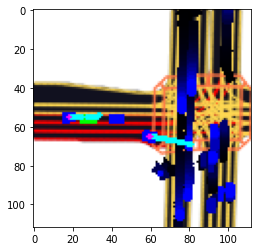

[[0.00269565 0.772902   0.22440234]]
[[5.2186014e-04 8.2645833e-01 1.7301986e-01]]
[[0.0014657  0.79468316 0.20385113]]


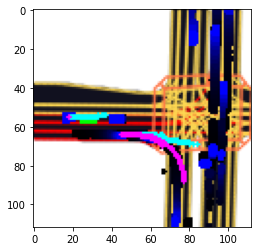

[[0.00142233 0.79536664 0.20321098]]


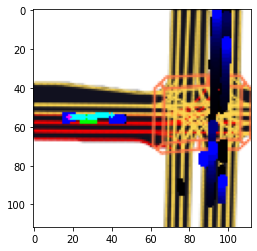

[[0.00253176 0.77325606 0.2242122 ]]


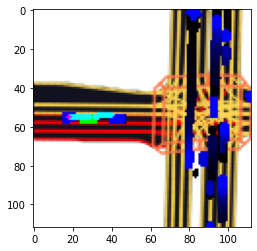

[[0.01383838 0.703215   0.28294668]]


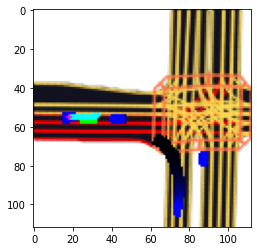

[[5.8696273e-04 8.2290018e-01 1.7651282e-01]]
[[0.00178393 0.7886077  0.20960836]]


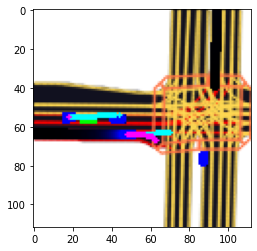

[[0.00215279 0.78047705 0.21737011]]
[[1.1778963e-11 9.9347275e-01 6.5272069e-03]]


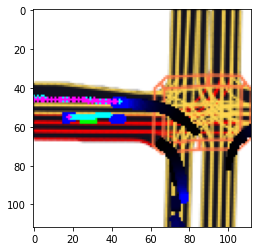

[[0.00550595 0.7455891  0.248905  ]]


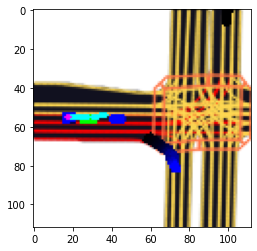

[[0.00908555 0.72435004 0.26656437]]
[[1.5875374e-04 8.5790581e-01 1.4193544e-01]]
[[0.00353489 0.7624678  0.23399737]]
[[0.02954433 0.65903264 0.31142306]]
[[0.00967563 0.721061   0.26926336]]


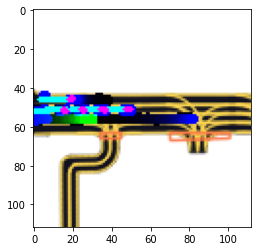

[[0.00207978 0.7808044  0.21711583]]
[[5.4505229e-04 8.2156193e-01 1.7789306e-01]]


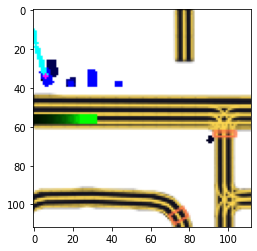

[[2.2872504e-11 9.9259055e-01 7.4094641e-03]]


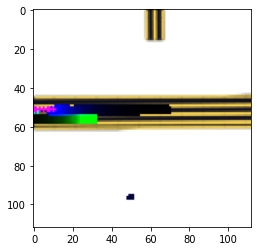

[[1.1670470e-08 9.7432739e-01 2.5672553e-02]]


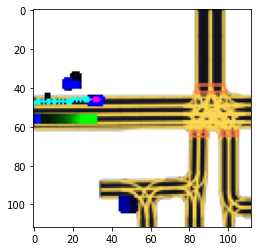

[[8.6040018e-05 8.7029338e-01 1.2962063e-01]]


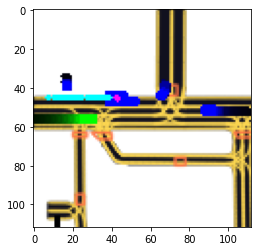

[[4.5419484e-04 8.2993412e-01 1.6961166e-01]]
[[0.00129288 0.798098   0.20060906]]
[[0.04539881 0.62892914 0.32567206]]
[[0.04087203 0.63657564 0.3225523 ]]
[[8.4682605e-10 9.8512810e-01 1.4871926e-02]]


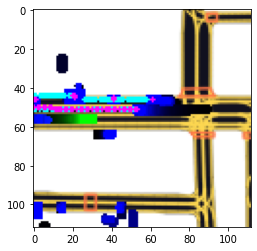

[[0.00147638 0.7933693  0.20515436]]
[[0.04533882 0.6304969  0.32416427]]
[[0.01574353 0.69630486 0.28795165]]
[[0.02575367 0.66577923 0.30846703]]
[[0.01640764 0.6942725  0.28931984]]
[[0.0037644  0.760734   0.23550153]]


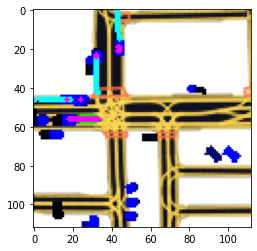

[[0.00162659 0.7898006  0.20857283]]
[[0.00187539 0.7860254  0.21209921]]
[[9.7707227e-05 8.6800081e-01 1.3190147e-01]]
[[0.01692157 0.6923265  0.2907519 ]]


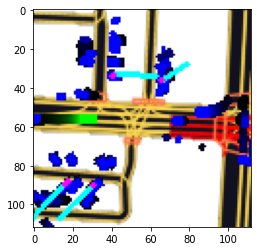

[[0.00560684 0.7443333  0.2500599 ]]
[[0.00146121 0.7948649  0.20367391]]
[[0.00176232 0.7865758  0.2116619 ]]
[[0.00199608 0.78414226 0.21386161]]


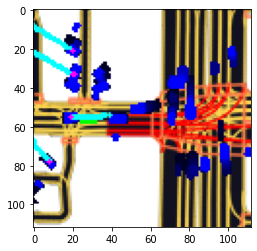

[[0.00113788 0.8033731  0.195489  ]]
[[1.7741154e-04 8.5483301e-01 1.4498954e-01]]
[[1.0911214e-04 8.6478281e-01 1.3510805e-01]]
[[0.00116009 0.79989064 0.19894935]]
[[1.01257945e-04 8.65758419e-01 1.34140313e-01]]


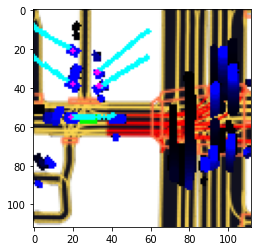

[[0.00240456 0.7780859  0.21950948]]
[[1.5975935e-04 8.5517681e-01 1.4466342e-01]]
[[3.1946518e-04 8.3807474e-01 1.6160576e-01]]
[[3.0850261e-04 8.4078538e-01 1.5890612e-01]]
[[2.1940754e-04 8.4762609e-01 1.5215452e-01]]
[[0.01251397 0.7086023  0.27888367]]
[[5.3652681e-08 9.6608233e-01 3.3917580e-02]]


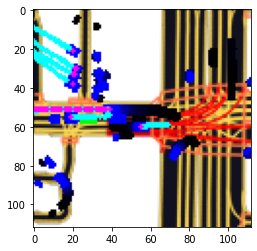

[[0.00754184 0.73231256 0.26014566]]
[[0.00364555 0.76206285 0.23429163]]
[[0.00189566 0.7860879  0.21201645]]
[[6.3114960e-05 8.7742019e-01 1.2251671e-01]]
[[2.1704914e-04 8.4627551e-01 1.5350746e-01]]
[[6.8309295e-05 8.7561119e-01 1.2432049e-01]]
[[4.21133191e-05 8.85603786e-01 1.14354156e-01]]
[[5.72153804e-05 8.77609253e-01 1.22333504e-01]]
[[6.7078340e-04 8.1731516e-01 1.8201403e-01]]


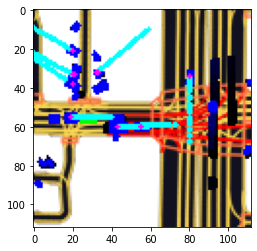

[[3.0179237e-04 8.4048158e-01 1.5921664e-01]]
[[1.1732649e-05 9.0813518e-01 9.1853112e-02]]
[[0.00153258 0.7913918  0.20707566]]
[[1.4297744e-05 9.0423852e-01 9.5747240e-02]]
[[1.3081252e-04 8.6169255e-01 1.3817661e-01]]
[[1.8443166e-04 8.5359633e-01 1.4621925e-01]]


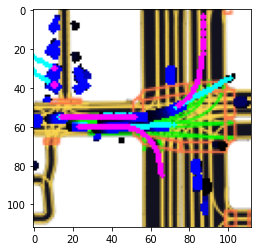

[[7.5774017e-04 8.1535715e-01 1.8388513e-01]]
[[1.2353172e-04 8.6139756e-01 1.3847896e-01]]
[[0.00135556 0.7972832  0.20136124]]
[[0.00417679 0.7569953  0.23882791]]
[[0.01445465 0.69923085 0.28631455]]
[[0.00128272 0.7991572  0.19956   ]]
[[3.0355000e-05 8.9122993e-01 1.0873971e-01]]
[[2.0233373e-04 8.5143739e-01 1.4836030e-01]]


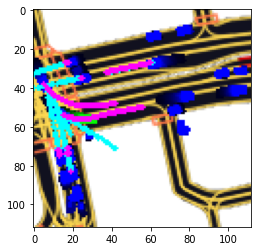

[[0.00275369 0.77294135 0.22430494]]
[[0.00417707 0.75558984 0.24023312]]
[[6.1100820e-04 8.2207334e-01 1.7731565e-01]]
[[0.00233417 0.7775073  0.22015853]]
[[7.9498749e-04 8.1481671e-01 1.8438834e-01]]
[[0.03851809 0.6408932  0.32058865]]
[[0.00353918 0.7643845  0.23207626]]
[[0.0023408  0.7786432  0.21901606]]
[[0.11275651 0.54315996 0.34408358]]
[[0.00184668 0.7869121  0.2112412 ]]


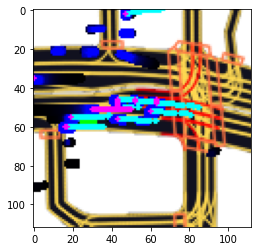

[[5.5739225e-04 8.2469517e-01 1.7474742e-01]]
[[0.00837384 0.72726154 0.26436457]]
[[0.00302067 0.76893526 0.22804402]]
[[0.06620818 0.5974627  0.33632913]]
[[4.7713149e-04 8.2989132e-01 1.6963159e-01]]
[[0.00209053 0.7828616  0.2150479 ]]
[[0.02028199 0.68188804 0.29782996]]
[[0.00092013 0.81132656 0.1877533 ]]
[[0.00902998 0.7232992  0.26767084]]
[[1.8453080e-05 9.0054023e-01 9.9441350e-02]]
[[0.00949727 0.72215915 0.2683436 ]]


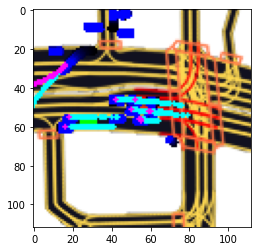

[[0.00730627 0.7323868  0.26030692]]
[[0.00116133 0.8030696  0.1957691 ]]
[[0.07438872 0.5869924  0.33861893]]
[[2.3260115e-04 8.4833431e-01 1.5143310e-01]]
[[2.4391837e-04 8.4512717e-01 1.5462889e-01]]
[[0.00236423 0.7783864  0.21924943]]
[[1.3431434e-04 8.6107475e-01 1.3879098e-01]]
[[0.00286687 0.77208436 0.22504872]]
[[0.0280286  0.66376555 0.3082058 ]]
[[4.289852e-04 8.323137e-01 1.672573e-01]]
[[0.22407003 0.44290864 0.3330213 ]]
[[5.2429124e-04 8.2555199e-01 1.7392372e-01]]


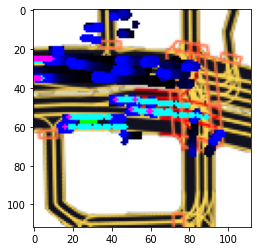

[[7.624678e-09 9.769503e-01 2.304976e-02]]
[[3.4612138e-05 8.8820881e-01 1.1175665e-01]]
[[0.00921782 0.7230094  0.26777282]]
[[5.9850858e-09 9.7807020e-01 2.1929733e-02]]
[[3.7031126e-04 8.3531874e-01 1.6431092e-01]]
[[1.0941730e-09 9.8434007e-01 1.5659958e-02]]
[[5.2077166e-06 9.2092687e-01 7.9067886e-02]]
[[0.00545997 0.74505955 0.2494805 ]]
[[7.1702685e-05 8.7532347e-01 1.2460483e-01]]
[[0.00951343 0.7199632  0.2705234 ]]
[[0.0049939  0.75052226 0.24448386]]
[[0.00809204 0.7292125  0.2626954 ]]
[[0.00555721 0.7435985  0.2508443 ]]
[[1.4806418e-04 8.5818851e-01 1.4166345e-01]]
[[0.02119347 0.6808741  0.2979324 ]]


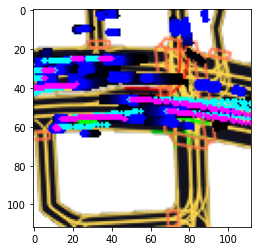

[[0.05398556 0.61672366 0.3292908 ]]
[[0.01346864 0.703783   0.2827484 ]]
[[0.00608608 0.7402358  0.2536781 ]]
[[0.00133094 0.79840225 0.20026678]]
[[0.00255741 0.7758809  0.22156177]]


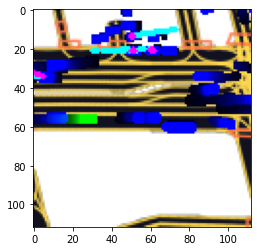

[[3.4718067e-10 9.8750722e-01 1.2492776e-02]]
[[2.3176790e-07 9.5477408e-01 4.5225628e-02]]
[[8.954470e-11 9.902636e-01 9.736463e-03]]
[[2.4577521e-05 8.9562994e-01 1.0434544e-01]]
[[1.4139523e-07 9.5930237e-01 4.0697489e-02]]
[[0.01129356 0.71314466 0.27556172]]
[[1.8514124e-08 9.7233409e-01 2.7665967e-02]]


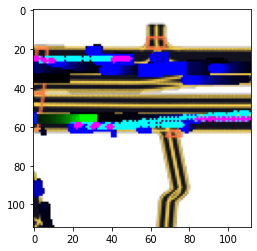

[[0.00176526 0.78863776 0.20959702]]
[[2.0475189e-05 8.9794141e-01 1.0203811e-01]]
[[2.5427011e-07 9.5373005e-01 4.6269663e-02]]
[[2.7768522e-08 9.7024667e-01 2.9753333e-02]]
[[3.7582086e-07 9.5047390e-01 4.9525738e-02]]


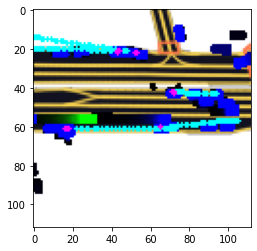

[[8.0819888e-04 8.1301504e-01 1.8617675e-01]]
[[0.00502471 0.74870795 0.24626735]]
[[1.1574435e-04 8.6082757e-01 1.3905668e-01]]
[[0.01922971 0.6863176  0.2944526 ]]
[[0.00415952 0.7567499  0.23909053]]
[[0.00744433 0.73278946 0.2597662 ]]
[[0.00556555 0.7442082  0.25022626]]
[[6.2160194e-05 8.7473375e-01 1.2520413e-01]]
[[1.1465093e-04 8.6483580e-01 1.3504960e-01]]
[[4.1420839e-04 8.3239436e-01 1.6719146e-01]]
[[0.0014621  0.7964925  0.20204543]]
[[0.00162835 0.7902287  0.20814294]]


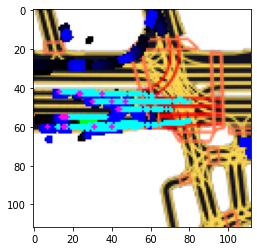

[[0.00512361 0.7494349  0.24544156]]
[[1.2546784e-07 9.6045500e-01 3.9544899e-02]]
[[0.04051346 0.63736165 0.3221249 ]]
[[0.00623221 0.7397988  0.253969  ]]
[[0.00759446 0.73225576 0.26014975]]
[[6.24419918e-05 8.76220644e-01 1.23716906e-01]]
[[0.00623168 0.73976415 0.25400415]]
[[0.01104918 0.7158081  0.27314276]]
[[6.1146566e-04 8.2235694e-01 1.7703165e-01]]
[[0.0015845  0.79200083 0.20641467]]
[[0.00329581 0.7670245  0.22967964]]


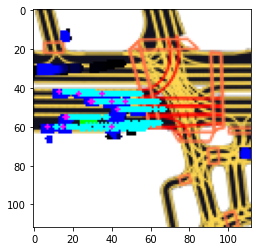

[[1.1740442e-07 9.6107936e-01 3.8920537e-02]]
[[2.4318555e-04 8.4658557e-01 1.5317124e-01]]
[[1.5419548e-10 9.8930794e-01 1.0692063e-02]]
[[1.2306380e-04 8.6252010e-01 1.3735685e-01]]
[[9.2334179e-05 8.7032282e-01 1.2958483e-01]]
[[5.9560682e-07 9.4690269e-01 5.3096697e-02]]
[[3.5756623e-06 9.2562777e-01 7.4368656e-02]]
[[9.2816161e-05 8.6970407e-01 1.3020314e-01]]
[[1.1015865e-06 9.4008911e-01 5.9909731e-02]]
[[1.32365485e-05 9.06365633e-01 9.36211124e-02]]


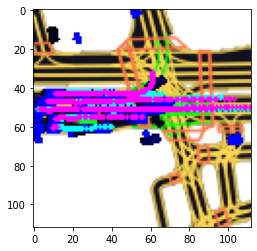

[[1.0711981e-11 9.9358577e-01 6.4142393e-03]]
[[1.0856861e-11 9.9356586e-01 6.4341878e-03]]
[[1.3671304e-11 9.9328423e-01 6.7158160e-03]]
[[1.3673459e-11 9.9328917e-01 6.7108814e-03]]
[[1.1005041e-11 9.9354953e-01 6.4504487e-03]]
[[4.439973e-11 9.915822e-01 8.417752e-03]]
[[0.02921647 0.66029876 0.31048477]]
[[0.00389485 0.7602076  0.23589756]]


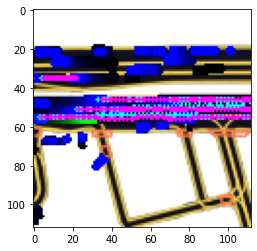

[[1.1005475e-11 9.9355078e-01 6.4492514e-03]]
[[1.1308229e-11 9.9351865e-01 6.4813201e-03]]
[[1.1155244e-11 9.9353313e-01 6.4668497e-03]]
[[1.07107595e-11 9.93582308e-01 6.41765026e-03]]
[[4.3922984e-08 9.6760613e-01 3.2393828e-02]]
[[4.3156910e-05 8.8442689e-01 1.1552991e-01]]
[[0.00125848 0.7985969  0.20014465]]
[[1.0801834e-07 9.6127361e-01 3.8726248e-02]]


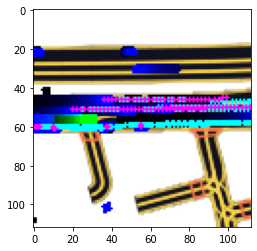

[[1.071076e-11 9.935824e-01 6.417602e-03]]
[[1.07107595e-11 9.93582308e-01 6.41765026e-03]]
[[1.0857374e-11 9.9356729e-01 6.4327857e-03]]
[[5.219930e-04 8.265539e-01 1.729241e-01]]


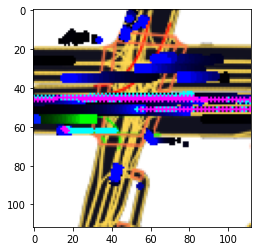

[[1.0566936e-11 9.9359977e-01 6.4002569e-03]]
[[1.0567621e-11 9.9360162e-01 6.3983104e-03]]


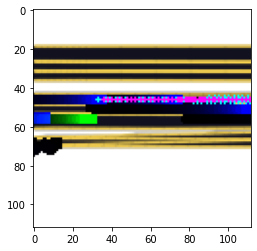

[[1.0566582e-11 9.9359882e-01 6.4012404e-03]]
[[1.3673459e-11 9.9328917e-01 6.7108814e-03]]
[[1.0566831e-11 9.9359953e-01 6.4005363e-03]]
[[0.00097767 0.8074906  0.19153175]]
[[1.0567309e-11 9.9360079e-01 6.3992026e-03]]
[[0.02428014 0.6722724  0.30344748]]
[[0.00175879 0.789982   0.20825921]]
[[1.0715517e-04 8.6582482e-01 1.3406798e-01]]


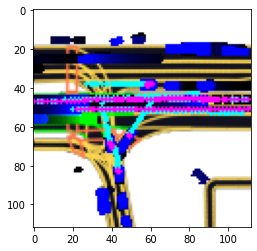

[[1.071076e-11 9.935824e-01 6.417602e-03]]
[[1.0566873e-11 9.9359953e-01 6.4004511e-03]]
[[1.0710632e-11 9.9358201e-01 6.4180335e-03]]
[[1.0567246e-11 9.9360055e-01 6.3994019e-03]]
[[3.5283663e-09 9.8000377e-01 1.9996174e-02]]
[[0.00282897 0.76957506 0.22759596]]
[[0.00489041 0.7477695  0.2473401 ]]
[[0.00592808 0.74250436 0.25156757]]


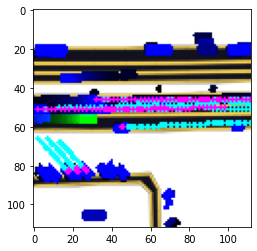

[[1.10052575e-11 9.93550062e-01 6.44986192e-03]]
[[3.8316785e-09 9.7981882e-01 2.0181241e-02]]
[[1.1007509e-11 9.9355620e-01 6.4437594e-03]]
[[1.071076e-11 9.935824e-01 6.417602e-03]]
[[1.0710507e-11 9.9358177e-01 6.4182947e-03]]


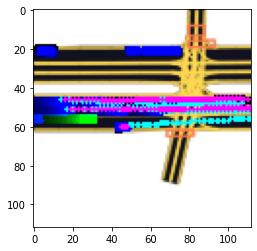

[[1.7446967e-11 9.9296677e-01 7.0332354e-03]]
[[1.10041325e-11 9.93547022e-01 6.45301724e-03]]
[[1.1004868e-11 9.9354905e-01 6.4509623e-03]]
[[1.0856178e-11 9.9356395e-01 6.4360290e-03]]
[[9.8295693e-08 9.6193343e-01 3.8066491e-02]]
[[4.9407563e-06 9.2009187e-01 7.9903245e-02]]
[[2.3580567e-06 9.3060529e-01 6.9392428e-02]]
[[4.6211176e-04 8.2848132e-01 1.7105657e-01]]


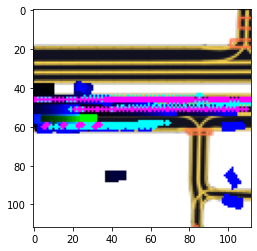

[[9.8965487e-05 8.6755908e-01 1.3234201e-01]]
[[1.0710337e-11 9.9358118e-01 6.4188233e-03]]
[[0.01101841 0.71467644 0.27430516]]
[[0.0521065  0.61916125 0.32873225]]
[[8.9796868e-07 9.4158214e-01 5.8416985e-02]]
[[0.00160563 0.79165393 0.20674045]]
[[1.0566373e-11 9.9359810e-01 6.4018765e-03]]


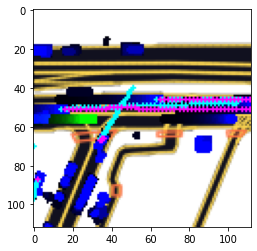

[[1.0566167e-11 9.9359763e-01 6.4023985e-03]]
[[1.0566582e-11 9.9359882e-01 6.4012404e-03]]


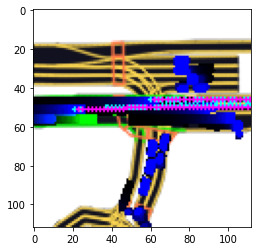

[[1.1005800e-11 9.9355161e-01 6.4484086e-03]]
[[7.1385689e-04 8.1683081e-01 1.8245538e-01]]


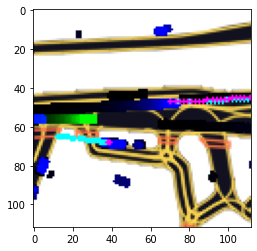

[[0.00769963 0.73207927 0.26022106]]
[[2.8689823e-04 8.4259981e-01 1.5711322e-01]]


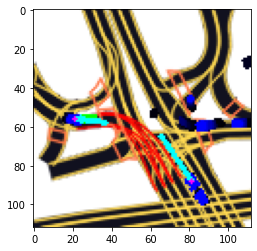

[[0.00405239 0.7576442  0.23830347]]
[[7.06337232e-05 8.75021160e-01 1.24908194e-01]]
[[6.91827736e-05 8.75152230e-01 1.24778606e-01]]
[[0.0038837  0.759048   0.23706833]]


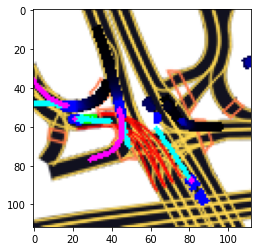

[[0.00090357 0.809764   0.18933241]]
[[3.1037396e-04 8.4041798e-01 1.5927161e-01]]
[[6.5314106e-04 8.2060301e-01 1.7874382e-01]]


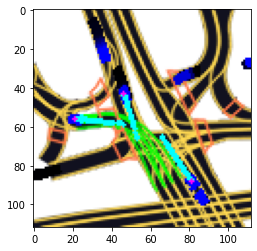

[[3.0627662e-06 9.2740631e-01 7.2590597e-02]]
[[1.3162730e-04 8.6140150e-01 1.3846684e-01]]
[[0.00554388 0.74550086 0.24895531]]


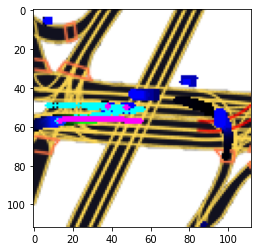

[[0.00895476 0.7242281  0.2668171 ]]
[[3.1247371e-04 8.4030455e-01 1.5938301e-01]]
[[4.1088537e-08 9.6809989e-01 3.1900015e-02]]
[[1.7021061e-05 9.0165502e-01 9.8327994e-02]]
[[1.3681586e-04 8.6013943e-01 1.3972373e-01]]
[[0.00107274 0.8051555  0.19377176]]


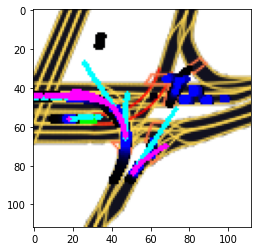

[[0.00273387 0.7728784  0.2243877 ]]
[[1.0288573e-05 9.1081035e-01 8.9179307e-02]]
[[6.49269059e-05 8.77452910e-01 1.22482084e-01]]


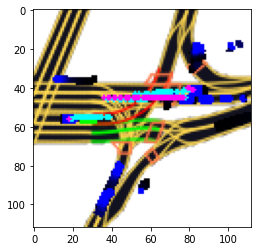

[[7.1884431e-05 8.7383252e-01 1.2609556e-01]]
[[7.5268861e-11 9.9068344e-01 9.3165459e-03]]
[[5.9498845e-10 9.8600566e-01 1.3994360e-02]]
[[0.00133581 0.7984483  0.20021589]]
[[0.00090518 0.80772275 0.19137204]]
[[3.61556701e-10 9.87409651e-01 1.25902835e-02]]
[[1.7320275e-09 9.8288846e-01 1.7111531e-02]]
[[1.5706632e-09 9.8295665e-01 1.7043369e-02]]


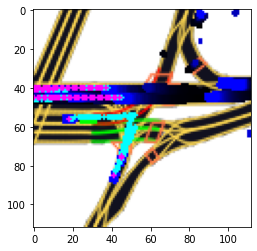

[[5.4926672e-06 9.1830832e-01 8.1686117e-02]]
[[0.00172755 0.787076   0.21119647]]
[[2.4749490e-04 8.4529030e-01 1.5446222e-01]]
[[1.33067906e-11 9.93320763e-01 6.67915028e-03]]


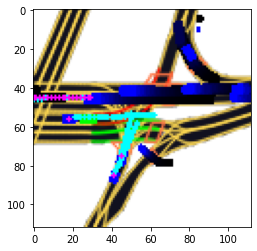

[[2.1721015e-04 8.4907389e-01 1.5070887e-01]]
[[4.2858437e-06 9.2335600e-01 7.6639764e-02]]
[[5.015154e-11 9.913828e-01 8.617218e-03]]
[[6.3986122e-11 9.9096972e-01 9.0303095e-03]]
[[2.508267e-10 9.882360e-01 1.176391e-02]]
[[1.9580830e-09 9.8256809e-01 1.7431896e-02]]
[[0.00186818 0.78730047 0.21083137]]


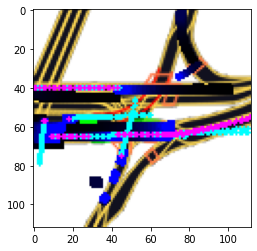

[[0.00517094 0.7488559  0.2459732 ]]
[[7.6718597e-06 9.1533172e-01 8.4660605e-02]]
[[1.0710739e-11 9.9358231e-01 6.4176987e-03]]


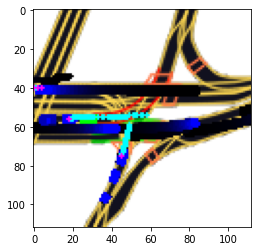

[[0.00091566 0.80944663 0.18963769]]
[[6.7462672e-05 8.7614644e-01 1.2378608e-01]]


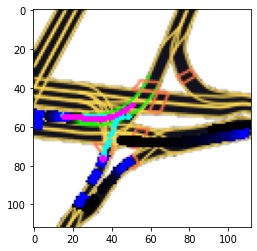

[[1.5029450e-11 9.9315852e-01 6.8415124e-03]]
[[1.8415981e-11 9.9288976e-01 7.1102576e-03]]
[[1.9707803e-11 9.9279988e-01 7.2001321e-03]]


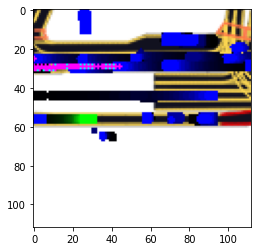

[[0.00291007 0.7709934  0.22609654]]
[[0.00163345 0.78866935 0.20969722]]
[[7.4309716e-04 8.1328273e-01 1.8597412e-01]]
[[1.7416141e-10 9.8905516e-01 1.0944826e-02]]


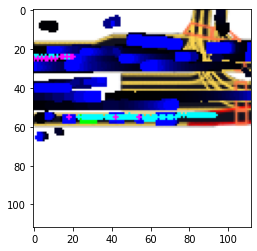

[[1.2433339e-11 9.9340135e-01 6.5986053e-03]]
[[3.0804204e-05 8.9141053e-01 1.0855864e-01]]
[[3.6853613e-05 8.8798803e-01 1.1197518e-01]]
[[2.7330956e-04 8.4290802e-01 1.5681866e-01]]


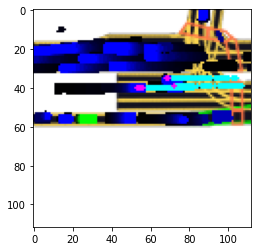

[[7.3360764e-07 9.4349676e-01 5.6502555e-02]]
[[1.1155419e-11 9.9353361e-01 6.4663719e-03]]
[[0.0047896  0.75080925 0.24440111]]
[[0.00094446 0.80777633 0.19127917]]


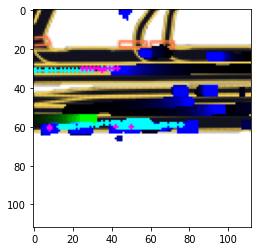

[[1.2767974e-06 9.3849057e-01 6.1508190e-02]]
[[4.987506e-07 9.480217e-01 5.197783e-02]]
[[1.3209527e-07 9.5968980e-01 4.0310111e-02]]
[[4.8210795e-06 9.2103153e-01 7.8963682e-02]]
[[4.1064466e-04 8.3180380e-01 1.6778558e-01]]
[[6.8094587e-06 9.1549414e-01 8.4499039e-02]]
[[0.00622158 0.74054575 0.2532327 ]]
[[0.01209352 0.710612   0.27729443]]
[[4.0270074e-04 8.3240932e-01 1.6718805e-01]]
[[4.0481996e-08 9.6800005e-01 3.1999968e-02]]
[[0.00712873 0.73391837 0.25895283]]


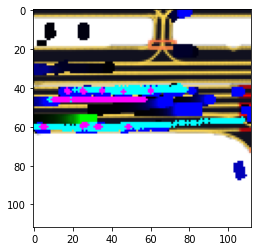

[[0.00380348 0.76061994 0.23557654]]
[[0.00778876 0.73099    0.26122126]]
[[7.8268576e-04 8.1424767e-01 1.8496969e-01]]
[[0.00308705 0.7691469  0.22776604]]
[[0.00087007 0.81152695 0.18760295]]
[[6.8116840e-04 8.2048208e-01 1.7883676e-01]]
[[4.514919e-04 8.303396e-01 1.692089e-01]]
[[1.31274705e-11 9.93337393e-01 6.66258810e-03]]


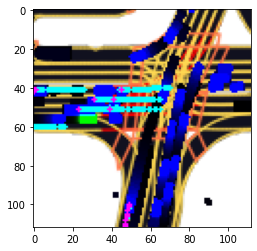

[[0.00435884 0.754211   0.2414301 ]]
[[0.01901131 0.68460375 0.29638496]]
[[0.01457558 0.69971794 0.2857064 ]]
[[0.00629124 0.7407504  0.25295842]]
[[0.06699894 0.5964334  0.3365677 ]]
[[4.9177319e-04 8.2800174e-01 1.7150648e-01]]
[[0.00166813 0.78999966 0.20833226]]
[[0.09183332 0.56708616 0.34108052]]
[[2.4585621e-04 8.4543806e-01 1.5431613e-01]]
[[8.3875060e-11 9.9048764e-01 9.5123444e-03]]


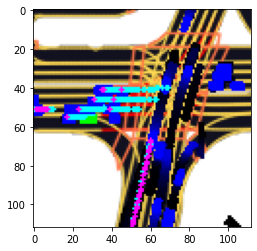

[[6.4180495e-04 8.2199198e-01 1.7736623e-01]]
[[0.00435312 0.75511336 0.24053349]]
[[0.0145127  0.7008502  0.28463712]]
[[4.9953780e-04 8.2858521e-01 1.7091525e-01]]
[[4.6018881e-04 8.2956094e-01 1.6997890e-01]]
[[1.8831102e-04 8.5347599e-01 1.4633568e-01]]
[[0.04115429 0.6364381  0.32240766]]
[[5.7659254e-05 8.7782967e-01 1.2211268e-01]]
[[0.00242984 0.77803    0.2195402 ]]
[[0.06858322 0.5955698  0.33584702]]


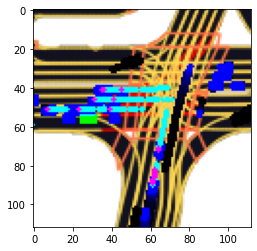

[[0.00546739 0.7470494  0.24748321]]
[[0.00126639 0.799671   0.1990626 ]]
[[0.00728831 0.73282766 0.25988406]]
[[0.00257312 0.7755043  0.22192262]]
[[0.04783016 0.6252951  0.32687476]]
[[4.0623281e-04 8.3303297e-01 1.6656081e-01]]
[[4.6012655e-04 8.2951039e-01 1.7002949e-01]]
[[0.04493589 0.6312439  0.32382026]]
[[2.0097033e-04 8.4902626e-01 1.5077274e-01]]
[[0.00280442 0.7717564  0.2254391 ]]
[[0.00100524 0.8073273  0.19166748]]
[[0.02198381 0.67834795 0.29966825]]


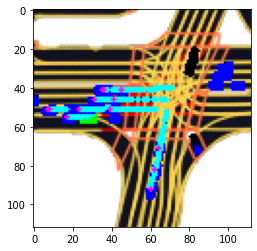

[[2.7624439e-04 8.4422392e-01 1.5549986e-01]]
[[2.1635082e-04 8.5017693e-01 1.4960678e-01]]
[[0.01934396 0.68582743 0.29482856]]
[[0.00100993 0.80639654 0.1925935 ]]
[[1.7079245e-04 8.5634005e-01 1.4348914e-01]]
[[4.4080801e-04 8.2929832e-01 1.7026083e-01]]
[[0.00655159 0.7385069  0.2549415 ]]
[[0.0897    0.5679878 0.3423122]]
[[0.04392258 0.6329221  0.32315534]]
[[1.6924186e-04 8.5561407e-01 1.4421672e-01]]
[[0.02059233 0.68081075 0.29859692]]
[[0.01188498 0.712212   0.27590296]]
[[2.7716844e-04 8.4287691e-01 1.5684590e-01]]
[[2.0260319e-04 8.4939820e-01 1.5039922e-01]]


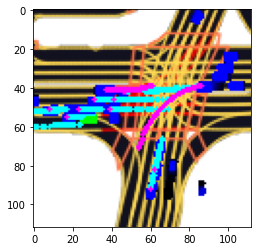

[[3.0859424e-06 9.2752385e-01 7.2473064e-02]]
[[2.0087043e-04 8.5136437e-01 1.4843480e-01]]
[[3.881972e-05 8.866022e-01 1.133590e-01]]
[[0.00378098 0.759651   0.23656802]]
[[0.02313943 0.6759336  0.30092692]]
[[0.00221591 0.78073084 0.21705325]]
[[2.9655412e-06 9.2812490e-01 7.1872205e-02]]
[[0.01082649 0.7147577  0.27441585]]
[[1.8384572e-10 9.8894101e-01 1.1059054e-02]]
[[1.7367977e-08 9.7308177e-01 2.6918223e-02]]
[[4.1810021e-05 8.8554806e-01 1.1441011e-01]]


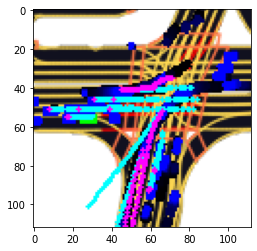

[[2.2047911e-04 8.4937125e-01 1.5040822e-01]]
[[0.00554018 0.74379027 0.2506695 ]]
[[1.6222619e-04 8.5807383e-01 1.4176388e-01]]
[[0.01217835 0.70767736 0.28014427]]
[[0.00128033 0.799809   0.19891071]]
[[2.3199218e-05 8.9734566e-01 1.0263119e-01]]
[[3.9439477e-05 8.8714629e-01 1.1281429e-01]]
[[3.1452163e-04 8.4011406e-01 1.5957138e-01]]
[[0.04730322 0.6272936  0.32540324]]
[[0.01598051 0.69514066 0.28887883]]
[[0.00185253 0.78536135 0.21278611]]
[[6.1772630e-04 8.2086790e-01 1.7851445e-01]]
[[0.00103279 0.80686367 0.19210356]]
[[0.05244003 0.61882013 0.32873985]]


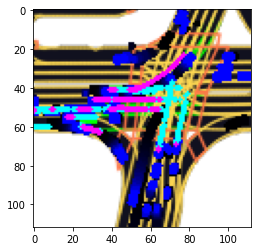

[[1.4127728e-07 9.5917064e-01 4.0829279e-02]]
[[1.1006297e-11 9.9355292e-01 6.4470451e-03]]
[[1.0711117e-11 9.9358338e-01 6.4166165e-03]]
[[2.41229391e-05 8.96373451e-01 1.03602424e-01]]
[[2.9885772e-04 8.4206229e-01 1.5763877e-01]]
[[6.8388246e-05 8.7599051e-01 1.2394111e-01]]
[[2.9253348e-08 9.6971691e-01 3.0283099e-02]]
[[1.9707803e-11 9.9279988e-01 7.2001321e-03]]
[[3.9463281e-08 9.6835023e-01 3.1649705e-02]]
[[1.6600237e-05 9.0257251e-01 9.7410865e-02]]


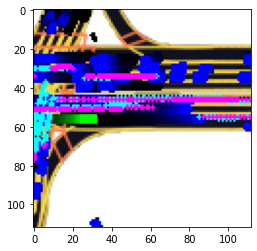

[[1.0566249e-11 9.9359775e-01 6.4022043e-03]]
[[1.0857374e-11 9.9356729e-01 6.4327857e-03]]
[[1.071076e-11 9.935824e-01 6.417602e-03]]
[[0.00200157 0.7838288  0.21416965]]
[[0.00205424 0.78291935 0.21502642]]


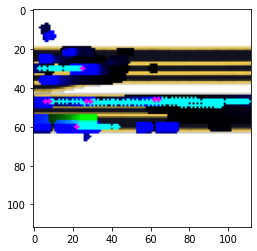

[[1.0425083e-11 9.9361718e-01 6.3828630e-03]]


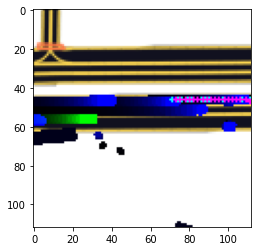

[[1.1004609e-11 9.9354833e-01 6.4516836e-03]]
[[3.4760654e-07 9.5166713e-01 4.8332524e-02]]
[[1.138828e-05 9.076911e-01 9.229753e-02]]


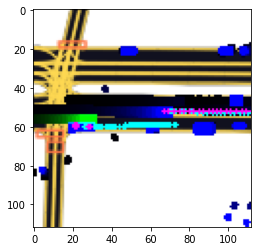

[[1.2758927e-05 9.0594238e-01 9.4044842e-02]]
[[1.0711792e-11 9.9358529e-01 6.4147627e-03]]
[[3.0248167e-04 8.4131426e-01 1.5838327e-01]]
[[0.00527197 0.7466495  0.24807853]]
[[9.0098474e-05 8.6919564e-01 1.3071428e-01]]


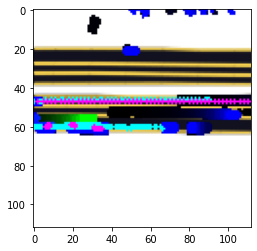

[[1.0710317e-11 9.9358118e-01 6.4188726e-03]]
[[6.0237373e-05 8.7829703e-01 1.2164275e-01]]
[[0.00088531 0.81005824 0.1890565 ]]


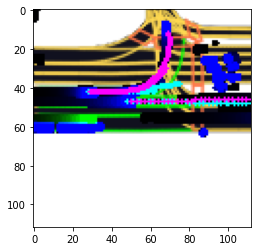

[[1.0566831e-11 9.9359953e-01 6.4005363e-03]]
[[4.139567e-06 9.234871e-01 7.650875e-02]]


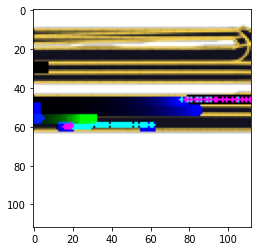

[[1.0857630e-11 9.9356800e-01 6.4320173e-03]]
[[1.0105811e-04 8.6748117e-01 1.3241780e-01]]
[[5.0899672e-04 8.2768327e-01 1.7180771e-01]]
[[0.00164902 0.78963166 0.20871925]]
[[0.06875025 0.59511757 0.33613217]]
[[0.08032979 0.5794519  0.34021828]]


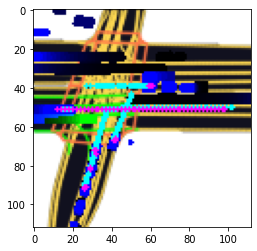

[[1.7955028e-05 9.0078568e-01 9.9196337e-02]]
[[9.3928655e-05 8.6896831e-01 1.3093776e-01]]
[[1.1401742e-07 9.6091598e-01 3.9083928e-02]]
[[5.7716479e-06 9.1835767e-01 8.1636496e-02]]
[[1.0028625e-06 9.4109845e-01 5.8900606e-02]]


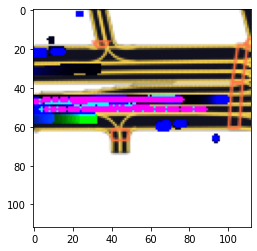

[[5.7302197e-05 8.8038635e-01 1.1955641e-01]]
[[2.2822565e-05 8.9666998e-01 1.0330721e-01]]
[[3.5704728e-05 8.8910240e-01 1.1086193e-01]]
[[6.7262692e-07 9.4587147e-01 5.4127775e-02]]
[[0.0016868  0.79021186 0.20810129]]
[[1.2106203e-06 9.3917167e-01 6.0827076e-02]]
[[2.1987937e-06 9.3237138e-01 6.7626357e-02]]
[[9.5595778e-06 9.1192096e-01 8.8069454e-02]]
[[7.16919239e-05 8.75273943e-01 1.24654345e-01]]
[[2.79089218e-05 8.93562734e-01 1.06409356e-01]]
[[7.8861376e-07 9.4385993e-01 5.6139249e-02]]


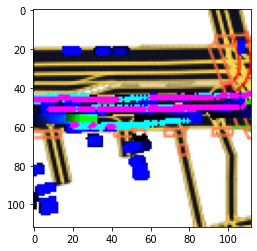

[[0.00151385 0.7935064  0.20497978]]
[[2.2872504e-11 9.9259055e-01 7.4094641e-03]]
[[1.6951222e-10 9.8911184e-01 1.0888150e-02]]
[[6.3647318e-04 8.2150382e-01 1.7785971e-01]]
[[2.1919454e-10 9.8856157e-01 1.1438493e-02]]
[[7.1089645e-10 9.8566955e-01 1.4330455e-02]]
[[1.6349250e-04 8.5585928e-01 1.4397725e-01]]
[[0.02709949 0.6646355  0.30826497]]
[[1.6389048e-09 9.8297369e-01 1.7026313e-02]]


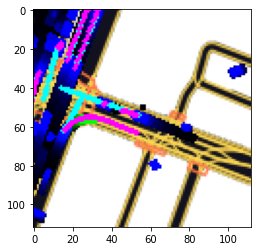

[[2.0323252e-07 9.5639813e-01 4.3601681e-02]]


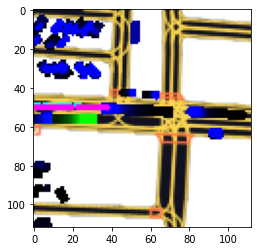

[[5.7709707e-07 9.4624835e-01 5.3751063e-02]]
[[4.33295572e-05 8.85688305e-01 1.14268355e-01]]
[[0.02025148 0.6827161  0.29703248]]
[[0.05086782 0.62107176 0.32806045]]


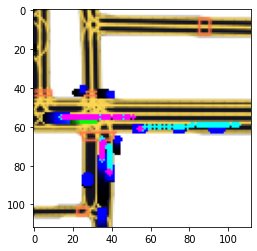

[[0.0013086  0.80006754 0.19862384]]


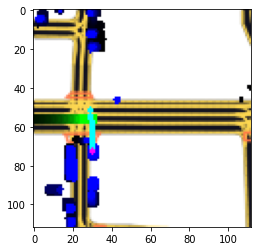

[[4.1126221e-04 8.3236313e-01 1.6722557e-01]]
[[6.9703360e-04 8.1850195e-01 1.8080099e-01]]
[[0.01311646 0.7060264  0.28085718]]


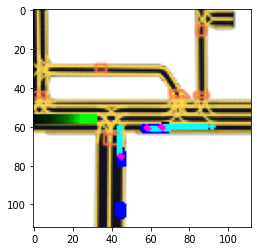

[[7.0134981e-10 9.8570651e-01 1.4293431e-02]]
[[0.01781655 0.68865347 0.29353   ]]
[[0.01624039 0.69445574 0.28930384]]


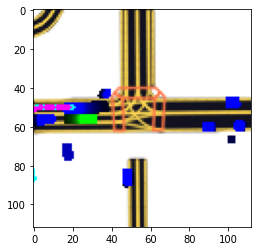

[[0.00119485 0.8003949  0.19841026]]
[[0.01012856 0.7180006  0.2718708 ]]
[[2.3018967e-04 8.4712511e-01 1.5264471e-01]]
[[1.0278525e-05 9.0859234e-01 9.1397405e-02]]


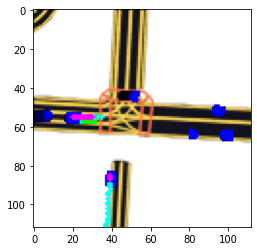

[[5.1357620e-07 9.4822896e-01 5.1770482e-02]]


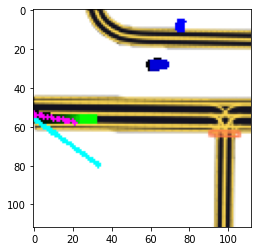

[[2.2385819e-08 9.7146106e-01 2.8538888e-02]]


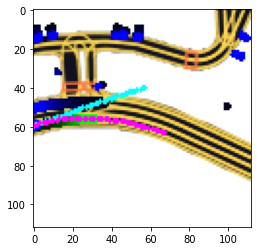

[[1.13100545e-11 9.93523598e-01 6.47644047e-03]]


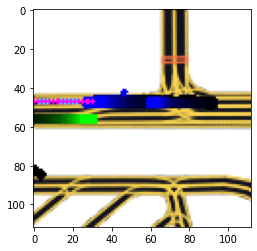

[[5.7409673e-09 9.7813189e-01 2.1868085e-02]]


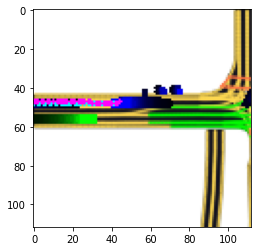

[[8.8689903e-06 9.1261965e-01 8.7371513e-02]]


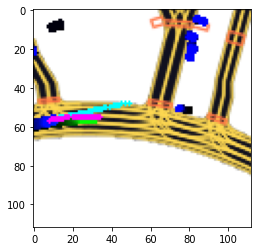

[[3.8928434e-08 9.6840870e-01 3.1591300e-02]]
[[1.9477632e-06 9.3366700e-01 6.6331029e-02]]


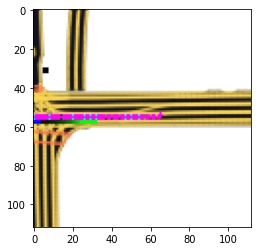

[[1.0361334e-09 9.8447108e-01 1.5528946e-02]]
[[1.0710632e-11 9.9358201e-01 6.4180335e-03]]


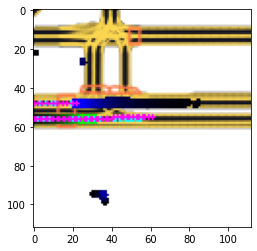

[[0.00165005 0.79127425 0.2070757 ]]


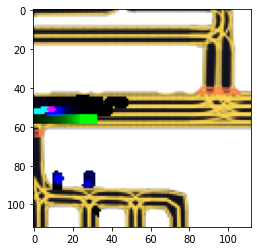

[[1.0710717e-11 9.9358219e-01 6.4177839e-03]]


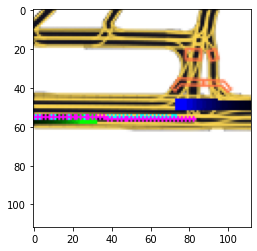

[[1.10048255e-11 9.93548930e-01 6.45108474e-03]]


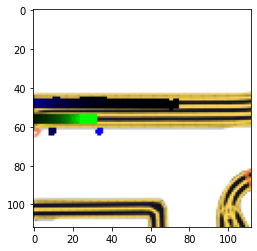

[[1.4940319e-08 9.7358638e-01 2.6413659e-02]]


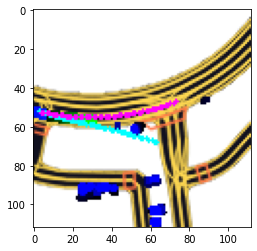

[[8.0305632e-08 9.6331269e-01 3.6687173e-02]]


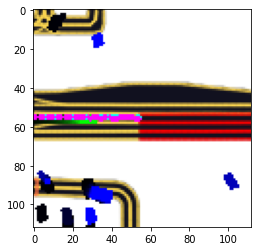

[[0.04312893 0.63426745 0.3226036 ]]
[[0.00177453 0.7879146  0.21031095]]
[[6.5796085e-05 8.7719041e-01 1.2274376e-01]]
[[2.2666431e-08 9.7126704e-01 2.8732894e-02]]
[[2.042087e-06 9.331987e-01 6.679929e-02]]
[[5.2568218e-04 8.2654941e-01 1.7292486e-01]]


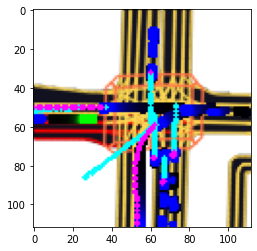

[[0.03305249 0.65293294 0.31401455]]
[[0.02160817 0.67861134 0.2997805 ]]
[[0.01161104 0.71285164 0.2755373 ]]
[[5.3787866e-04 8.2721525e-01 1.7224687e-01]]
[[0.02570238 0.6678295  0.3064681 ]]
[[1.1798760e-04 8.6499995e-01 1.3488200e-01]]
[[0.07079645 0.59240526 0.33679834]]
[[0.00507346 0.749753   0.24517353]]
[[0.01795316 0.6902875  0.29175937]]
[[0.01614388 0.696365   0.28749105]]


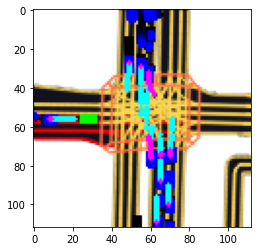

[[0.00145266 0.795333   0.2032143 ]]
[[1.5655975e-11 9.9311197e-01 6.8881116e-03]]
[[3.7419148e-05 8.8833916e-01 1.1162339e-01]]
[[0.02826684 0.6628534  0.30887973]]
[[1.561515e-05 9.032295e-01 9.675490e-02]]
[[1.1088232e-04 8.6546189e-01 1.3442726e-01]]
[[0.00644967 0.7393369  0.25421348]]
[[8.6887397e-10 9.8496222e-01 1.5037812e-02]]
[[8.7371387e-05 8.7071276e-01 1.2919988e-01]]
[[2.4476412e-05 8.9438838e-01 1.0558721e-01]]


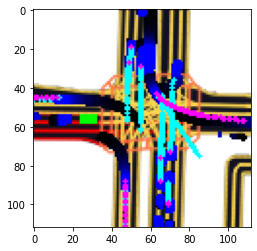

[[7.8092788e-05 8.7324435e-01 1.2667751e-01]]
[[0.01434054 0.70034665 0.28531277]]
[[4.8010174e-10 9.8668122e-01 1.3318756e-02]]
[[0.01200163 0.710404   0.27759433]]
[[6.1227901e-10 9.8603350e-01 1.3966528e-02]]
[[1.9325325e-08 9.7240055e-01 2.7599446e-02]]
[[1.7518328e-09 9.8268247e-01 1.7317565e-02]]
[[1.3647323e-04 8.6171067e-01 1.3815285e-01]]
[[0.03715779 0.6437543  0.31908795]]


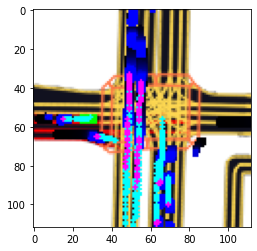

[[0.00379717 0.7613782  0.23482457]]
[[0.00232518 0.7787907  0.21888408]]
[[4.8812159e-11 9.9142754e-01 8.5724909e-03]]
[[3.0393292e-11 9.9217403e-01 7.8260135e-03]]
[[1.21025395e-11 9.93439257e-01 6.56076707e-03]]


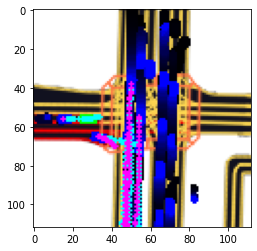

[[1.2905874e-04 8.6190116e-01 1.3796978e-01]]
[[0.00221053 0.78117096 0.21661857]]
[[0.03311279 0.65223825 0.31464896]]
[[2.4806044e-11 9.9247110e-01 7.5288364e-03]]
[[1.483063e-11 9.931833e-01 6.816668e-03]]


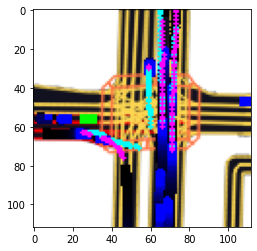

[[0.00529917 0.74730074 0.24740009]]
[[1.9579680e-05 8.9931011e-01 1.0067036e-01]]
[[5.832343e-05 8.792595e-01 1.206822e-01]]


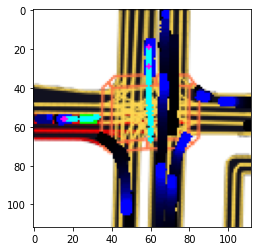

[[3.8645281e-05 8.8739961e-01 1.1256173e-01]]
[[3.1401467e-04 8.3952385e-01 1.6016211e-01]]
[[0.00122765 0.7999422  0.19883017]]
[[0.01003302 0.7199229  0.27004412]]


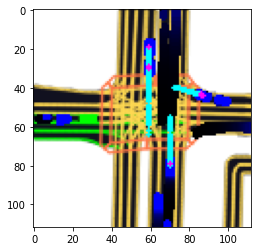

[[8.2488077e-10 9.8525596e-01 1.4744011e-02]]


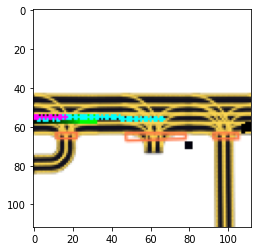

[[1.9079271e-05 8.9998925e-01 9.9991649e-02]]
[[0.00504371 0.74880356 0.24615277]]
[[0.02607306 0.66781664 0.30611026]]


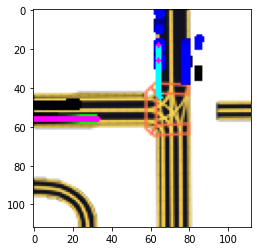

[[0.03255279 0.6533154  0.31413183]]
[[0.00327228 0.7669868  0.22974092]]
[[0.00220228 0.7768513  0.22094643]]
[[1.8760555e-04 8.4963655e-01 1.5017585e-01]]
[[0.03318174 0.65234685 0.31447142]]
[[1.34594975e-05 9.05105054e-01 9.48814228e-02]]
[[0.01828957 0.6877051  0.29400536]]
[[0.00081903 0.812708   0.18647291]]


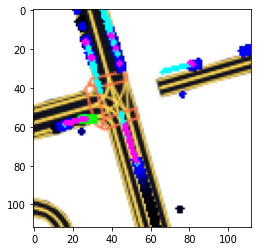

[[1.5354371e-06 9.3566185e-01 6.4336568e-02]]


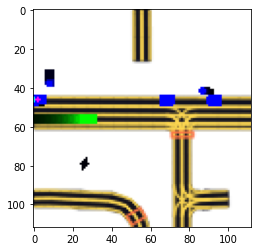

[[7.4287836e-04 8.1587875e-01 1.8337840e-01]]
[[0.02244452 0.67662644 0.30092907]]
[[0.01297564 0.7059793  0.28104508]]
[[3.2607717e-09 9.8049337e-01 1.9506672e-02]]
[[2.9004150e-05 8.9240301e-01 1.0756794e-01]]


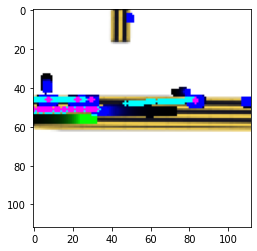

[[2.5249984e-09 9.8149866e-01 1.8501293e-02]]
[[5.85599591e-05 8.78284693e-01 1.21656716e-01]]
[[0.00343483 0.7637238  0.23284139]]
[[0.01481302 0.6976102  0.28757674]]
[[7.2741546e-05 8.7308764e-01 1.2683956e-01]]


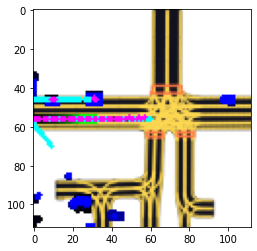

[[0.00107805 0.80432904 0.19459297]]
[[0.00827087 0.72800183 0.26372725]]
[[0.01990261 0.6843465  0.2957509 ]]
[[3.4893262e-09 9.8025930e-01 1.9740745e-02]]
[[0.04539887 0.62961966 0.32498142]]


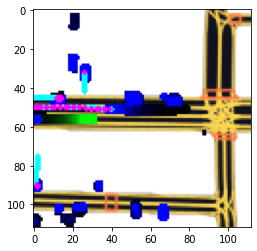

[[0.00939368 0.7220316  0.26857466]]
[[0.0010638  0.8046467  0.19428957]]
[[0.01207164 0.7098781  0.2780503 ]]
[[3.9521055e-04 8.3067054e-01 1.6893423e-01]]
[[5.3675106e-04 8.2376593e-01 1.7569736e-01]]
[[2.7909258e-04 8.4282815e-01 1.5689270e-01]]
[[0.02418897 0.6722019  0.3036092 ]]
[[2.1471665e-04 8.4998780e-01 1.4979742e-01]]
[[0.00718252 0.7340918  0.25872567]]
[[0.00702985 0.73544735 0.25752276]]
[[6.4737716e-04 8.1991524e-01 1.7943732e-01]]
[[0.0015173  0.79301083 0.20547186]]


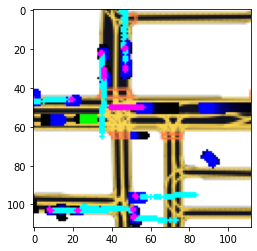

[[0.00360581 0.76192015 0.23447403]]
[[5.6891766e-04 8.2443154e-01 1.7499956e-01]]
[[8.0127700e-04 8.1242031e-01 1.8677837e-01]]
[[5.0815994e-05 8.8030225e-01 1.1964691e-01]]
[[0.00160148 0.7920261  0.20637244]]
[[0.00197045 0.7832145  0.21481504]]
[[5.5200253e-05 8.7970340e-01 1.2024137e-01]]
[[0.0087909  0.7239351  0.26727393]]


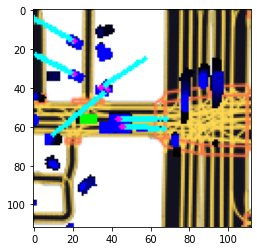

[[2.8642267e-04 8.3942080e-01 1.6029283e-01]]
[[0.00159187 0.79243803 0.20597012]]
[[2.7449770e-04 8.4448063e-01 1.5524483e-01]]
[[5.7363056e-04 8.2221425e-01 1.7721207e-01]]
[[0.00109454 0.801992   0.19691347]]
[[0.0009795  0.80821794 0.19080257]]
[[2.3864277e-06 9.3010372e-01 6.9893889e-02]]
[[1.4569551e-04 8.5748225e-01 1.4237204e-01]]
[[5.6005636e-05 8.7982702e-01 1.2011695e-01]]
[[0.00669888 0.73601764 0.2572835 ]]


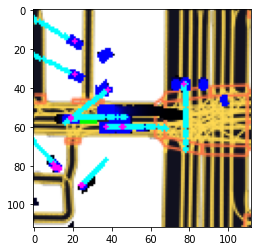

[[0.00322509 0.7654064  0.23136845]]
[[5.0009530e-05 8.8195884e-01 1.1799111e-01]]
[[7.5620417e-05 8.7426502e-01 1.2565933e-01]]
[[4.4901020e-04 8.3091509e-01 1.6863593e-01]]
[[7.7537663e-07 9.4328839e-01 5.6710869e-02]]
[[5.9787981e-04 8.1918013e-01 1.8022193e-01]]
[[6.0570671e-04 8.2144374e-01 1.7795056e-01]]
[[3.1990971e-04 8.3858532e-01 1.6109473e-01]]
[[1.0781478e-04 8.6551350e-01 1.3437869e-01]]
[[0.00233028 0.77825356 0.21941617]]
[[5.7457853e-04 8.2283986e-01 1.7658556e-01]]
[[1.4566999e-08 9.7390389e-01 2.6096158e-02]]


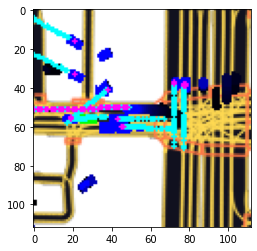

[[0.00267362 0.77386373 0.22346261]]
[[2.060976e-08 9.716887e-01 2.831128e-02]]
[[4.3505916e-06 9.2180985e-01 7.8185774e-02]]
[[0.00095194 0.80535495 0.19369313]]
[[2.5687326e-05 8.9406562e-01 1.0590877e-01]]
[[4.1073238e-09 9.7972840e-01 2.0271616e-02]]


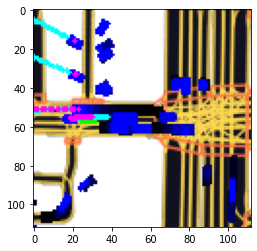

[[2.2972388e-04 8.4892792e-01 1.5084234e-01]]
[[1.5347463e-05 9.0433675e-01 9.5647901e-02]]
[[1.0817725e-04 8.6665452e-01 1.3323735e-01]]
[[4.3237389e-08 9.6739173e-01 3.2608163e-02]]
[[3.0859982e-04 8.4090024e-01 1.5879114e-01]]
[[6.3168275e-04 8.2131422e-01 1.7805403e-01]]
[[0.00232679 0.7790681  0.21860515]]
[[4.8263208e-04 8.2890129e-01 1.7061609e-01]]
[[7.2023924e-04 8.1753594e-01 1.8174379e-01]]
[[0.0016002  0.7917109  0.20668887]]
[[3.9883089e-05 8.8623172e-01 1.1372838e-01]]


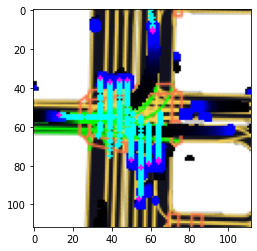

[[0.03911785 0.63988066 0.32100153]]
[[1.6364334e-05 9.0251142e-01 9.7472258e-02]]
[[5.7724816e-07 9.4629937e-01 5.3700034e-02]]
[[2.8104694e-05 8.9354455e-01 1.0642729e-01]]
[[1.4720559e-05 9.0450764e-01 9.5477700e-02]]
[[1.3746632e-05 9.0509319e-01 9.4893120e-02]]
[[3.4033597e-05 8.8954210e-01 1.1042387e-01]]
[[9.7441734e-06 9.1136885e-01 8.8621385e-02]]


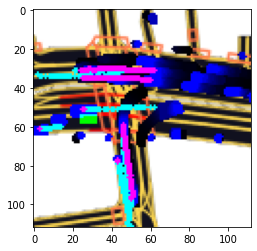

[[2.5632175e-08 9.7079694e-01 2.9203007e-02]]
[[6.9147726e-10 9.8570168e-01 1.4298296e-02]]
[[7.700237e-05 8.732580e-01 1.266650e-01]]
[[7.6298730e-04 8.1529766e-01 1.8393940e-01]]
[[1.0438126e-06 9.4062167e-01 5.9377242e-02]]
[[6.2803316e-05 8.7810463e-01 1.2183261e-01]]
[[1.0697786e-04 8.6526066e-01 1.3463230e-01]]
[[3.2800462e-04 8.3740073e-01 1.6227132e-01]]
[[2.6557436e-07 9.5393807e-01 4.6061710e-02]]


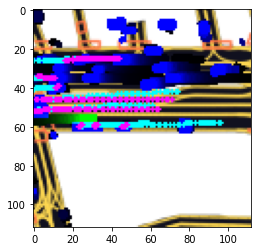

[[1.3975357e-05 9.0577471e-01 9.4211310e-02]]
[[1.0771261e-05 9.0984571e-01 9.0143599e-02]]
[[1.9967108e-04 8.5174227e-01 1.4805801e-01]]
[[4.1616073e-05 8.8630384e-01 1.1365454e-01]]
[[1.3656086e-06 9.3778723e-01 6.2211450e-02]]
[[2.3638318e-09 9.8186159e-01 1.8138457e-02]]
[[6.841399e-06 9.167302e-01 8.326293e-02]]
[[2.1818227e-08 9.7175622e-01 2.8243776e-02]]


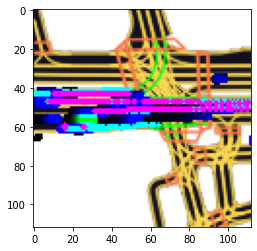

[[1.1005560e-11 9.9355090e-01 6.4490987e-03]]
[[1.0711075e-11 9.9358326e-01 6.4167627e-03]]
[[1.0710781e-11 9.9358243e-01 6.4175767e-03]]
[[1.1940270e-06 9.3923557e-01 6.0763203e-02]]
[[1.9061779e-05 8.9972001e-01 1.0026086e-01]]
[[7.8230994e-05 8.7383008e-01 1.2609169e-01]]
[[0.0008698  0.811407   0.18772322]]
[[0.00815526 0.72804886 0.26379588]]


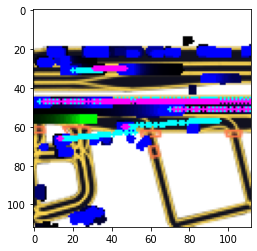

[[1.0857223e-11 9.9356681e-01 6.4331442e-03]]
[[1.05661035e-11 9.93597388e-01 6.40259869e-03]]
[[7.6294401e-11 9.9065924e-01 9.3408003e-03]]
[[1.0653540e-08 9.7512674e-01 2.4873247e-02]]
[[1.2253691e-06 9.3874592e-01 6.1252870e-02]]
[[2.3870829e-08 9.7071415e-01 2.9285772e-02]]
[[1.07102955e-11 9.93581057e-01 6.41895179e-03]]
[[1.071076e-11 9.935824e-01 6.417602e-03]]


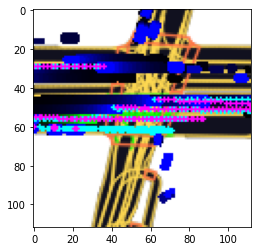

[[1.0567621e-11 9.9360162e-01 6.3983104e-03]]
[[1.0857160e-11 9.9356669e-01 6.4333095e-03]]
[[1.0710043e-11 9.9358034e-01 6.4196694e-03]]
[[1.1007161e-11 9.9355525e-01 6.4446880e-03]]


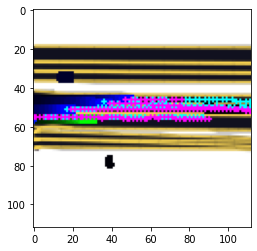

[[1.05672675e-11 9.93600667e-01 6.39934139e-03]]
[[4.0386066e-11 9.9173427e-01 8.2657840e-03]]
[[1.0566167e-11 9.9359763e-01 6.4023985e-03]]
[[1.0566582e-11 9.9359882e-01 6.4012404e-03]]
[[1.05673924e-11 9.93601024e-01 6.39899028e-03]]
[[0.00869441 0.72522086 0.26608473]]
[[1.2066869e-04 8.6303598e-01 1.3684340e-01]]


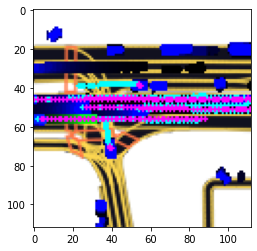

[[2.3598425e-09 9.8172760e-01 1.8272437e-02]]
[[2.4228204e-09 9.8157859e-01 1.8421423e-02]]
[[1.2178440e-09 9.8393929e-01 1.6060738e-02]]
[[1.7684788e-11 9.9294841e-01 7.0515880e-03]]
[[1.0025185e-06 9.4102687e-01 5.8972169e-02]]


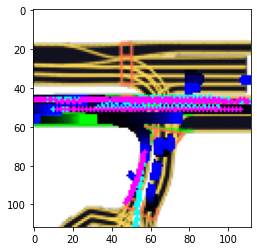

[[6.930807e-06 9.164363e-01 8.355678e-02]]
[[2.1635376e-06 9.3189639e-01 6.8101406e-02]]
[[8.495418e-08 9.632940e-01 3.670595e-02]]
[[1.1307896e-11 9.9351776e-01 6.4822226e-03]]
[[0.00260759 0.7751729  0.22221947]]


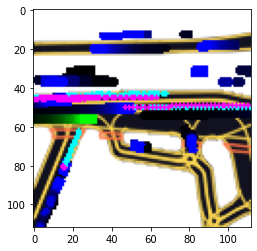

[[5.2700652e-05 8.8067645e-01 1.1927086e-01]]
[[7.8909815e-04 8.1467110e-01 1.8453985e-01]]
[[0.00254782 0.7757923  0.2216599 ]]
[[0.01859749 0.6872389  0.29416358]]
[[0.00274848 0.7721799  0.22507164]]
[[5.328320e-04 8.263236e-01 1.731435e-01]]
[[9.903450e-05 8.677948e-01 1.321062e-01]]
[[4.7355628e-05 8.8255990e-01 1.1739275e-01]]
[[1.0233930e-04 8.6697173e-01 1.3292593e-01]]
[[0.00129018 0.800045   0.1986648 ]]
[[7.4237853e-08 9.6418023e-01 3.5819694e-02]]
[[8.2132146e-07 9.4352412e-01 5.6475077e-02]]
[[3.5753948e-11 9.9192566e-01 8.0743870e-03]]
[[8.7350224e-11 9.9041325e-01 9.5868157e-03]]
[[2.0553939e-06 9.3307203e-01 6.6925913e-02]]


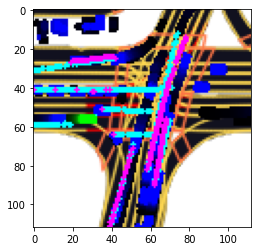

[[7.586845e-05 8.730150e-01 1.269091e-01]]
[[0.10566501 0.5497874  0.34454754]]
[[0.0590809  0.60814345 0.3327756 ]]
[[0.04609354 0.62780225 0.3261042 ]]
[[0.2009675 0.4613289 0.3377036]]
[[0.00113453 0.8022224  0.19664314]]
[[0.01082871 0.716284   0.27288726]]
[[0.0162663  0.69366103 0.2900727 ]]
[[2.3381208e-05 8.9546639e-01 1.0451026e-01]]
[[1.0854338e-06 9.3994743e-01 6.0051508e-02]]
[[9.1045267e-06 9.1207922e-01 8.7911606e-02]]
[[1.2478810e-05 9.0763259e-01 9.2354976e-02]]
[[4.055475e-06 9.236436e-01 7.635234e-02]]
[[1.6752520e-11 9.9302155e-01 6.9784611e-03]]
[[1.329716e-05 9.056637e-01 9.432297e-02]]
[[1.9939066e-10 9.8876745e-01 1.1232607e-02]]


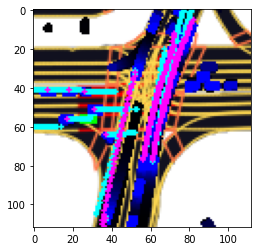

[[0.1357876  0.5195969  0.34461552]]
[[4.5087641e-06 9.2192584e-01 7.8069605e-02]]
[[0.01515532 0.6996392  0.28520554]]
[[0.00686584 0.7359387  0.25719544]]
[[0.04356349 0.6318656  0.32457092]]


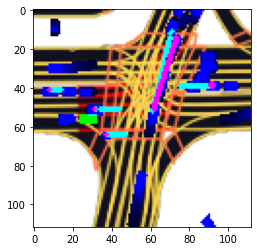

[[0.04075717 0.6382746  0.32096824]]
[[0.06147826 0.6045813  0.33394042]]
[[0.08092541 0.5800972  0.33897737]]
[[0.03993423 0.6380855  0.3219803 ]]
[[0.00082156 0.8138921  0.1852863 ]]
[[1.2919927e-04 8.5983896e-01 1.4003183e-01]]
[[0.00996545 0.7200643  0.26997024]]
[[3.2161063e-04 8.4052688e-01 1.5915149e-01]]
[[0.00139894 0.79578835 0.20281269]]


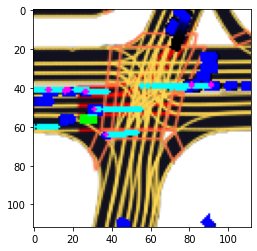

[[0.10674009 0.54939455 0.3438653 ]]
[[0.00559179 0.7446808  0.24972738]]
[[0.00600656 0.74209046 0.25190294]]
[[0.0068783  0.73523444 0.2578873 ]]
[[1.5309717e-05 9.0363145e-01 9.6353158e-02]]
[[1.1811613e-05 9.0803951e-01 9.1948651e-02]]
[[0.00933827 0.72251356 0.2681482 ]]
[[0.00384859 0.7610968  0.2350546 ]]
[[0.02443122 0.67046636 0.30510244]]
[[0.00107855 0.8045102  0.19441126]]
[[0.00304233 0.76896524 0.2279924 ]]
[[0.0239882  0.6731619  0.30284986]]
[[0.00116782 0.8024894  0.19634272]]


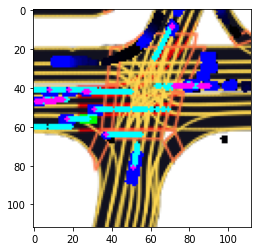

[[2.28758818e-05 8.97365272e-01 1.02611855e-01]]
[[5.7700858e-05 8.8034844e-01 1.1959385e-01]]
[[6.9391819e-05 8.7614316e-01 1.2378744e-01]]
[[7.1601914e-07 9.4428867e-01 5.5710666e-02]]
[[1.3837728e-10 9.8952776e-01 1.0472238e-02]]
[[2.5936617e-06 9.2979079e-01 7.0206583e-02]]
[[1.0837994e-06 9.3962824e-01 6.0370672e-02]]
[[0.00221647 0.7808319  0.21695167]]
[[2.9516764e-10 9.8788983e-01 1.2110148e-02]]
[[1.9489142e-05 9.0001965e-01 9.9960893e-02]]
[[2.6653405e-08 9.7040659e-01 2.9593388e-02]]
[[3.9886745e-05 8.8626057e-01 1.1369950e-01]]


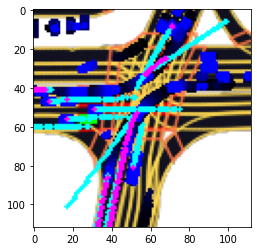

[[1.1019496e-04 8.6574560e-01 1.3414420e-01]]
[[2.8549526e-05 8.9403003e-01 1.0594137e-01]]
[[9.4106181e-05 8.6960328e-01 1.3030264e-01]]
[[8.1177404e-07 9.4400972e-01 5.5989508e-02]]
[[1.7955685e-05 9.0079641e-01 9.9185646e-02]]
[[0.00163334 0.7914389  0.20692778]]
[[9.1320038e-07 9.4214380e-01 5.7855256e-02]]
[[5.3715044e-06 9.1983122e-01 8.0163360e-02]]
[[0.00165811 0.7918059  0.20653595]]
[[1.0208259e-05 9.1059452e-01 8.9395210e-02]]
[[3.2298296e-05 8.9079863e-01 1.0916906e-01]]
[[7.32241751e-05 8.75272036e-01 1.24654725e-01]]


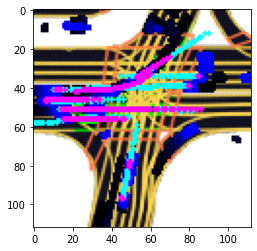

[[0.00232432 0.7786423  0.21903336]]
[[0.01899866 0.68720144 0.2937999 ]]
[[0.00467151 0.75216824 0.24316025]]
[[1.071076e-11 9.935824e-01 6.417602e-03]]
[[1.0566936e-11 9.9359977e-01 6.4002569e-03]]
[[0.01866397 0.6858045  0.2955315 ]]
[[6.5446191e-04 8.1868595e-01 1.8065964e-01]]
[[1.0566249e-11 9.9359775e-01 6.4022043e-03]]
[[3.0393292e-11 9.9217403e-01 7.8260135e-03]]
[[1.08560496e-11 9.93563652e-01 6.43635169e-03]]


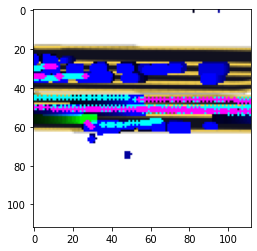

[[1.0856605e-11 9.9356514e-01 6.4348830e-03]]
[[4.2958080e-05 8.8519639e-01 1.1476062e-01]]
[[1.8965782e-05 9.0030700e-01 9.9674001e-02]]
[[5.5920612e-08 9.6595967e-01 3.4040309e-02]]


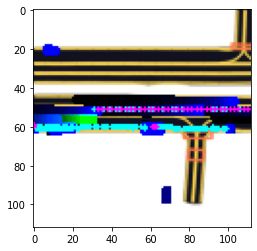

[[1.0566249e-11 9.9359775e-01 6.4022043e-03]]
[[1.0566373e-11 9.9359810e-01 6.4018765e-03]]
[[1.2432498e-06 9.3882859e-01 6.1170164e-02]]
[[2.6408484e-06 9.2905277e-01 7.0944540e-02]]
[[1.927228e-05 8.988024e-01 1.011783e-01]]


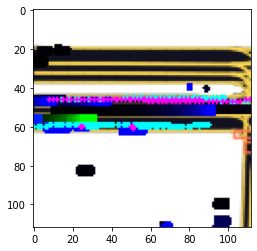

[[1.0856497e-11 9.9356478e-01 6.4351563e-03]]
[[1.05672675e-11 9.93600667e-01 6.39934139e-03]]
[[1.3287299e-10 9.8960900e-01 1.0390962e-02]]
[[8.0183945e-06 9.1395015e-01 8.6041890e-02]]


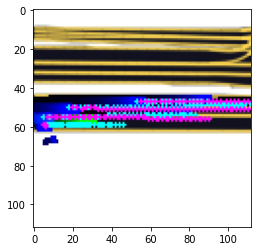

[[1.1462367e-11 9.9350172e-01 6.4983037e-03]]
[[1.0710317e-11 9.9358118e-01 6.4188726e-03]]
[[5.6376171e-06 9.1957450e-01 8.0419876e-02]]


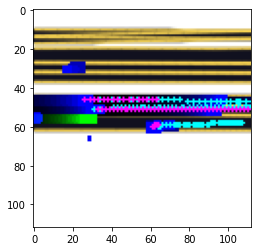

[[1.07107595e-11 9.93582308e-01 6.41765026e-03]]
[[1.071076e-11 9.935824e-01 6.417602e-03]]
[[0.04613082 0.62741995 0.32644922]]
[[1.0567309e-11 9.9360079e-01 6.3992026e-03]]
[[0.00673442 0.7367278  0.25653774]]
[[1.14597064e-11 9.93494689e-01 6.50528353e-03]]
[[1.0567309e-11 9.9360079e-01 6.3992026e-03]]


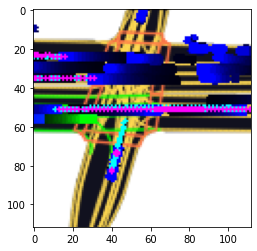

[[1.0700784e-10 9.9003208e-01 9.9679166e-03]]
[[5.015154e-11 9.913828e-01 8.617218e-03]]
[[3.0393292e-11 9.9217403e-01 7.8260135e-03]]
[[4.9333874e-04 8.2654595e-01 1.7296079e-01]]
[[0.00377374 0.76030666 0.23591954]]
[[6.1775199e-07 9.4577336e-01 5.4225955e-02]]
[[2.3348418e-04 8.4716308e-01 1.5260345e-01]]


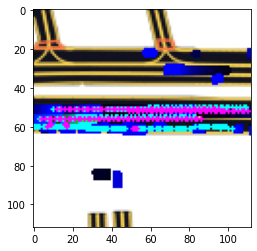

[[3.9960009e-09 9.7979158e-01 2.0208396e-02]]
[[4.093643e-11 9.917127e-01 8.287325e-03]]
[[1.4469727e-05 9.0362448e-01 9.6361093e-02]]
[[3.8906410e-06 9.2384481e-01 7.6151334e-02]]
[[5.1216284e-05 8.8055879e-01 1.1939005e-01]]
[[0.00725559 0.7324398  0.26030457]]


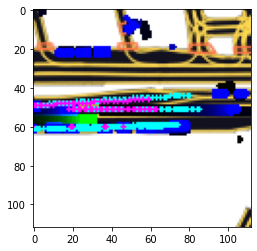

[[1.071076e-11 9.935824e-01 6.417602e-03]]
[[1.5629582e-10 9.8928016e-01 1.0719860e-02]]
[[2.6047372e-04 8.4336811e-01 1.5637141e-01]]
[[0.00367863 0.7614251  0.23489626]]
[[0.00337248 0.7634654  0.2331621 ]]


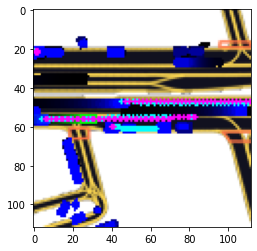

[[4.5152827e-08 9.6752924e-01 3.2470785e-02]]
[[4.2632040e-09 9.7928256e-01 2.0717418e-02]]
[[3.1581757e-10 9.8773152e-01 1.2268449e-02]]
[[3.1832827e-04 8.3676320e-01 1.6291846e-01]]
[[3.4786315e-06 9.2579651e-01 7.4199982e-02]]
[[3.2552247e-04 8.3720094e-01 1.6247357e-01]]
[[4.2045154e-09 9.7930384e-01 2.0696184e-02]]
[[0.00427887 0.7553114  0.24040969]]
[[0.00309408 0.7686394  0.22826652]]


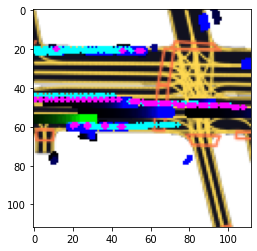

[[0.00761169 0.7317349  0.26065344]]
[[1.3335866e-04 8.6104387e-01 1.3882282e-01]]
[[0.00234912 0.7786481  0.21900283]]
[[0.00665748 0.73782074 0.25552174]]
[[0.00192395 0.784957   0.21311907]]
[[0.01753504 0.6908604  0.29160458]]


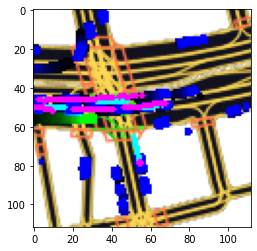

[[2.4418217e-10 9.8830777e-01 1.1692216e-02]]
[[1.2686644e-09 9.8383844e-01 1.6161583e-02]]
[[5.8995586e-11 9.9110949e-01 8.8904770e-03]]
[[4.3105197e-10 9.8697841e-01 1.3021570e-02]]
[[7.0344237e-11 9.9080384e-01 9.1962051e-03]]
[[2.0248721e-11 9.9276227e-01 7.2377510e-03]]
[[8.163543e-11 9.905370e-01 9.463016e-03]]


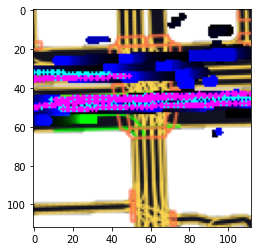

[[7.0676382e-04 8.1840706e-01 1.8088612e-01]]
[[6.8869795e-06 9.1662264e-01 8.3370462e-02]]
[[0.00410191 0.756833   0.23906507]]
[[1.8992339e-05 8.9864564e-01 1.0133538e-01]]


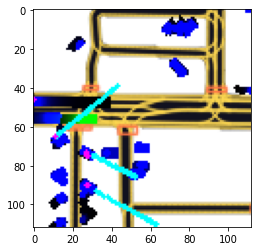

[[9.4113972e-10 9.8464507e-01 1.5354913e-02]]
[[7.4325167e-06 9.1440052e-01 8.5592054e-02]]
[[0.00207934 0.7821293  0.21579136]]


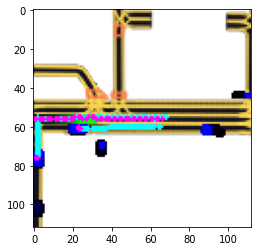

[[7.9161493e-04 8.1318319e-01 1.8602523e-01]]
[[0.00472813 0.75131285 0.24395896]]


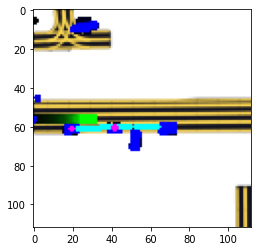

[[2.2705792e-06 9.3165123e-01 6.8346500e-02]]
[[0.01839626 0.68717283 0.29443088]]
[[0.02393365 0.6722576  0.30380872]]
[[3.1342019e-08 9.6952605e-01 3.0473907e-02]]
[[0.02080163 0.6805643  0.29863405]]


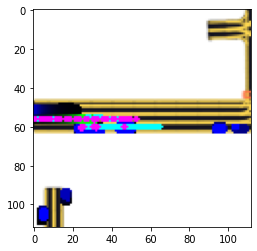

[[3.5731392e-07 9.5154870e-01 4.8450965e-02]]


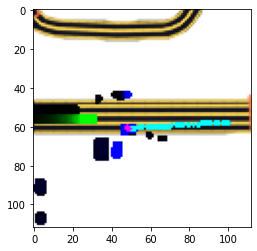

[[0.01794365 0.69007474 0.29198158]]
[[1.0090481e-04 8.6696690e-01 1.3293217e-01]]
[[5.8368716e-04 8.2077736e-01 1.7863896e-01]]
[[0.00232444 0.77725005 0.22042547]]
[[5.8218382e-05 8.7867498e-01 1.2126679e-01]]
[[0.02096109 0.6793283  0.2997106 ]]
[[3.6426475e-06 9.2499226e-01 7.5004086e-02]]


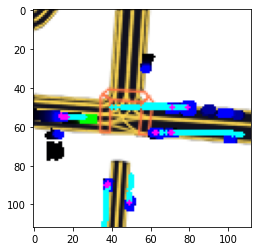

[[7.1867724e-04 8.1670594e-01 1.8257539e-01]]
[[0.00125605 0.7992233  0.19952065]]
[[1.6575976e-04 8.5574287e-01 1.4409129e-01]]
[[2.6797379e-06 9.2917585e-01 7.0821442e-02]]


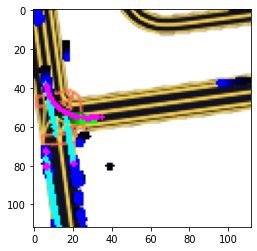

[[1.4623750e-11 9.9318510e-01 6.8149576e-03]]


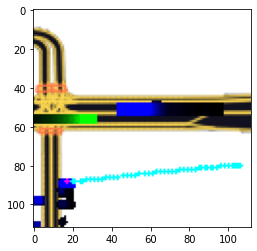

[[3.3134824e-05 8.8998729e-01 1.0997959e-01]]


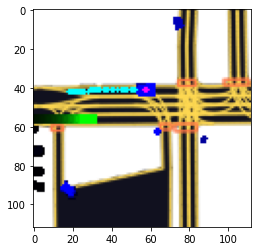

[[8.7783349e-07 9.4271880e-01 5.7280272e-02]]


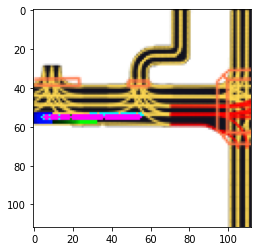

[[1.0857160e-11 9.9356669e-01 6.4333095e-03]]


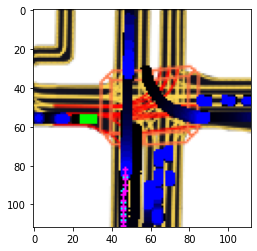

[[0.12650183 0.5286882  0.34480998]]
[[3.3825816e-04 8.3834469e-01 1.6131708e-01]]
[[0.06883241 0.5942171  0.33695045]]
[[4.1288420e-04 8.3382452e-01 1.6576266e-01]]
[[0.02091488 0.6813046  0.29778057]]
[[0.0229521  0.6741245  0.30292347]]
[[0.00619059 0.7399558  0.2538536 ]]
[[0.01546599 0.6977589  0.28677505]]
[[0.02377285 0.67242664 0.30380052]]
[[0.10166272 0.55513823 0.34319904]]


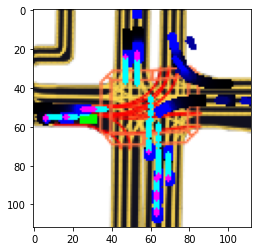

[[0.00237383 0.7785946  0.2190315 ]]
[[0.00139708 0.79665166 0.20195122]]
[[0.02242107 0.67763627 0.29994267]]
[[0.00467113 0.7535702  0.24175869]]
[[0.00539901 0.7476907  0.24691029]]
[[0.00580487 0.7426063  0.25158882]]
[[0.09251681 0.5651367  0.34234652]]
[[0.00396182 0.7585188  0.2375194 ]]
[[1.9124303e-04 8.5395116e-01 1.4585765e-01]]
[[7.4142057e-09 9.7697073e-01 2.3029260e-02]]
[[7.009673e-04 8.179569e-01 1.813421e-01]]


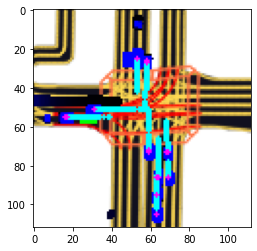

[[2.8046521e-09 9.8086369e-01 1.9136295e-02]]


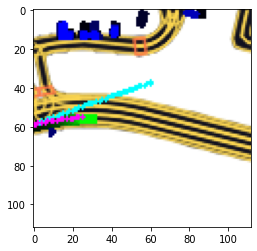

[[2.5060534e-10 9.8818910e-01 1.1810854e-02]]


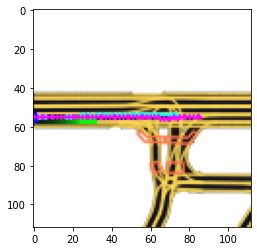

[[7.868878e-06 9.145735e-01 8.541860e-02]]
[[0.00509015 0.748212   0.24669784]]


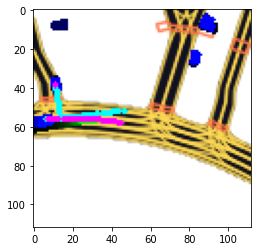

[[4.2437656e-05 8.8579959e-01 1.1415795e-01]]


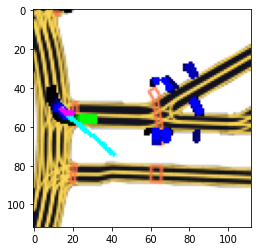

[[2.2326909e-09 9.8180825e-01 1.8191695e-02]]
[[7.6061302e-10 9.8548305e-01 1.4516999e-02]]


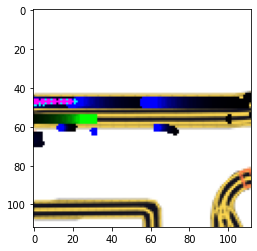

[[6.1361526e-08 9.6515310e-01 3.4846786e-02]]
[[8.2442919e-10 9.8522019e-01 1.4779839e-02]]
[[2.0589901e-07 9.5622051e-01 4.3779235e-02]]


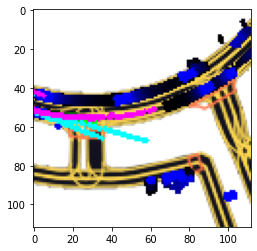

[[2.2094548e-06 9.3186194e-01 6.8135850e-02]]
[[9.8810324e-07 9.4094694e-01 5.9052080e-02]]
[[5.8549836e-06 9.1841894e-01 8.1575245e-02]]


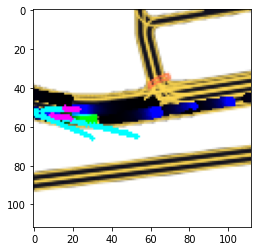

[[1.2284005e-05 9.0717447e-01 9.2813194e-02]]


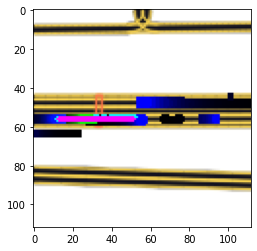

[[2.4794067e-06 9.3079889e-01 6.9198675e-02]]
[[4.341141e-06 9.230360e-01 7.695972e-02]]


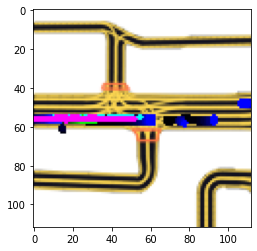

[[0.12315974 0.5329487  0.34389162]]
[[0.0403734  0.63881207 0.32081452]]
[[7.4463629e-04 8.1678361e-01 1.8247171e-01]]
[[0.13760106 0.5177359  0.34466302]]
[[0.05956455 0.6084509  0.33198458]]
[[0.08056684 0.5804933  0.33893988]]
[[0.05654254 0.61287606 0.3305814 ]]
[[0.00117339 0.80159205 0.19723451]]


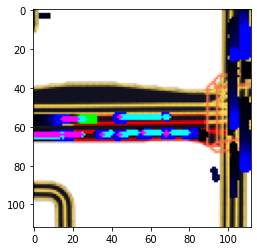

[[0.12382489 0.53222895 0.34394616]]
[[3.6859105e-04 8.3620399e-01 1.6342735e-01]]
[[0.00150516 0.7940225  0.20447236]]
[[0.09015488 0.56844854 0.3413966 ]]
[[0.113014   0.54266465 0.34432137]]
[[0.05121305 0.6201916  0.32859537]]
[[0.07445955 0.58733296 0.3382075 ]]
[[0.03732727 0.6441171  0.31855565]]
[[0.09026025 0.56885314 0.3408866 ]]


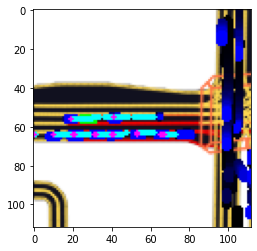

[[0.0767189  0.58415043 0.33913067]]
[[7.8052905e-04 8.1589603e-01 1.8332341e-01]]
[[1.8207898e-04 8.5404330e-01 1.4577468e-01]]
[[0.03232285 0.65476745 0.3129097 ]]
[[0.06985568 0.5942271  0.33591723]]
[[0.01294106 0.70633996 0.28071892]]
[[0.04042299 0.63789314 0.32168388]]
[[0.00421994 0.756859   0.23892108]]
[[0.01723875 0.691184   0.2915773 ]]
[[3.6735115e-11 9.9188340e-01 8.1165358e-03]]


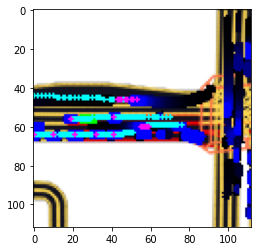

[[0.05733137 0.6112341  0.3314345 ]]
[[7.6036510e-04 8.1668174e-01 1.8255787e-01]]
[[0.03845402 0.6416453  0.31990066]]
[[0.06337383 0.6015969  0.33502927]]
[[0.15271375 0.50462615 0.34266013]]
[[0.00823687 0.72776973 0.26399338]]
[[5.1965861e-04 8.2752073e-01 1.7195967e-01]]
[[0.00339126 0.765706   0.23090273]]
[[0.00170664 0.7892486  0.20904483]]
[[0.09128148 0.56693804 0.34178042]]
[[0.04193083 0.6345807  0.32348853]]
[[0.01944736 0.68366826 0.29688445]]


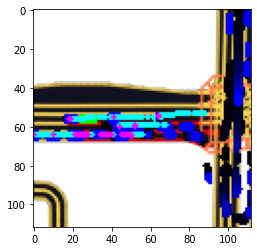

[[0.09034386 0.56852794 0.34112823]]
[[0.00386672 0.7615662  0.23456703]]
[[7.7610643e-04 8.1642193e-01 1.8280192e-01]]
[[0.01134461 0.71353185 0.2751235 ]]
[[0.0103406  0.71775746 0.27190194]]
[[0.0444059  0.6315623  0.32403183]]
[[0.00980821 0.72081834 0.26937345]]
[[2.8911498e-04 8.4283394e-01 1.5687694e-01]]
[[0.00252187 0.77593756 0.22154061]]
[[0.03918039 0.63979954 0.3210201 ]]
[[0.01165797 0.7130452  0.2752968 ]]
[[0.04042212 0.63788486 0.3216931 ]]


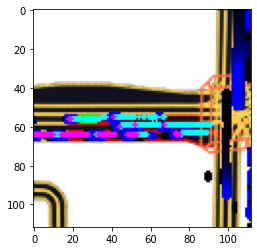

[[0.00131593 0.7981074  0.20057668]]
[[2.5057411e-04 8.4720415e-01 1.5254529e-01]]
[[0.02857346 0.6628567  0.3085698 ]]
[[0.0009376  0.8104167  0.18864568]]
[[6.45464024e-05 8.77835274e-01 1.22100174e-01]]
[[0.03309776 0.65276396 0.31413832]]
[[0.00153642 0.7937733  0.2046903 ]]
[[0.08423278 0.57525265 0.34051457]]
[[0.11251083 0.54368836 0.34380084]]
[[4.1449358e-04 8.3265013e-01 1.6693534e-01]]
[[1.10053884e-11 9.93550420e-01 6.44950196e-03]]


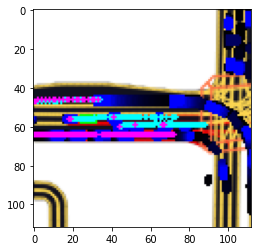

[[7.7453791e-04 8.1564730e-01 1.8357815e-01]]
[[5.9323682e-04 8.2425290e-01 1.7515382e-01]]
[[1.7431389e-04 8.5607779e-01 1.4374791e-01]]
[[0.0020625  0.7831126  0.21482494]]
[[0.00394232 0.7593839  0.23667379]]
[[0.05115163 0.6211095  0.32773888]]
[[0.01496211 0.69877607 0.2862618 ]]
[[0.00227483 0.7799253  0.21779987]]
[[0.00219362 0.78233606 0.21547028]]
[[1.1465298e-11 9.9350935e-01 6.4905751e-03]]
[[0.01693236 0.6925831  0.29048452]]
[[0.00565086 0.7460715  0.24827763]]
[[6.3986122e-11 9.9096972e-01 9.0303095e-03]]


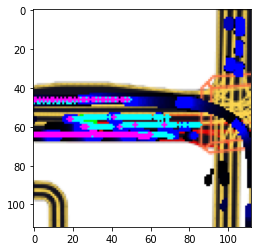

[[4.5815448e-04 8.3054125e-01 1.6900063e-01]]
[[5.8202120e-04 8.2237005e-01 1.7704789e-01]]
[[1.4848678e-04 8.5918057e-01 1.4067094e-01]]
[[2.9501173e-04 8.4248185e-01 1.5722314e-01]]
[[0.00507364 0.7483306  0.24659576]]
[[0.00197935 0.7850101  0.21301055]]
[[0.0069665  0.736091   0.25694248]]
[[0.03090319 0.6569164  0.31218046]]
[[0.01314712 0.70553076 0.2813221 ]]
[[1.1156735e-11 9.9353713e-01 6.4628315e-03]]
[[8.3865359e-11 9.9048257e-01 9.5173689e-03]]


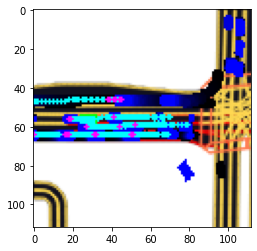

[[0.00362704 0.7628627  0.23351029]]
[[2.5362984e-04 8.4649014e-01 1.5325621e-01]]
[[2.3344863e-05 8.9710987e-01 1.0286676e-01]]
[[1.5425880e-05 9.0377724e-01 9.6207350e-02]]
[[7.0000660e-06 9.1719645e-01 8.2796536e-02]]
[[0.00479315 0.7511095  0.24409735]]


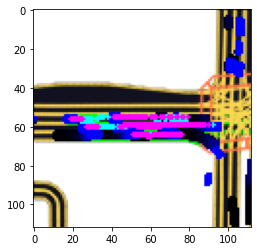

[[2.2209271e-04 8.4945726e-01 1.5032068e-01]]
[[2.5608320e-05 8.9526349e-01 1.0471094e-01]]
[[0.00150462 0.79387903 0.20461634]]
[[6.9787464e-04 8.1896186e-01 1.8034025e-01]]
[[3.0095738e-05 8.9291835e-01 1.0705159e-01]]
[[1.0463481e-04 8.6732000e-01 1.3257532e-01]]
[[0.00182222 0.78722703 0.21095076]]
[[0.00175963 0.78877056 0.20946977]]
[[0.03649847 0.64591104 0.31759048]]


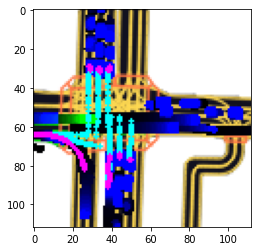

[[1.4945170e-08 9.7362196e-01 2.6378037e-02]]
[[0.00662378 0.7371986  0.2561776 ]]


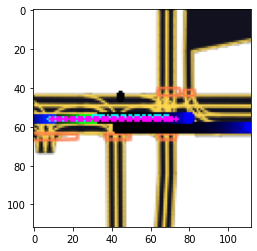

[[2.8129862e-06 9.2897993e-01 7.1017236e-02]]


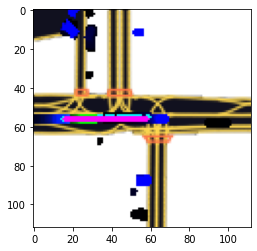

[[1.2205918e-05 9.0736336e-01 9.2624389e-02]]


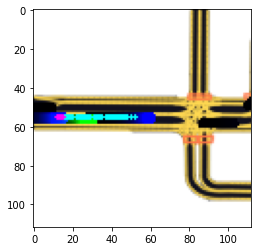

[[1.0618843e-05 9.0980417e-01 9.0185188e-02]]
[[0.00516049 0.74803466 0.24680483]]


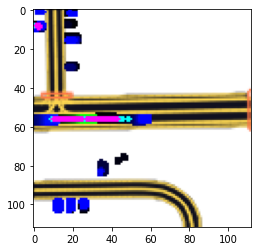

[[0.01097929 0.71611804 0.27290267]]
[[0.0167134  0.6930886  0.29019806]]
[[1.37871785e-08 9.74054158e-01 2.59457845e-02]]
[[0.093818   0.56480044 0.34138152]]


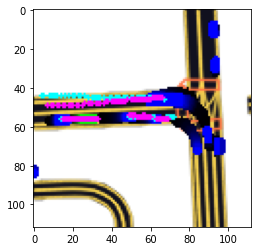

[[0.07843418 0.5828023  0.33876354]]
[[0.03378467 0.65093625 0.3152791 ]]
[[8.3222825e-05 8.7095100e-01 1.2896577e-01]]
[[0.04188764 0.63626695 0.32184544]]
[[1.5979150e-07 9.5857275e-01 4.1427087e-02]]


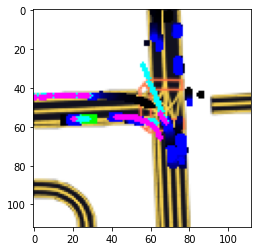

[[0.03394242 0.65064436 0.3154132 ]]
[[0.00489337 0.75088876 0.24421792]]
[[3.96846772e-05 8.84658992e-01 1.15301356e-01]]
[[0.00302573 0.76960856 0.22736572]]
[[0.00992134 0.7197052  0.27037343]]
[[1.9355954e-04 8.5322171e-01 1.4658475e-01]]


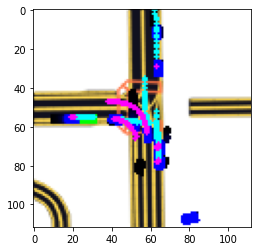

[[0.05721889 0.6118621  0.330919  ]]
[[0.00451384 0.7540313  0.24145487]]
[[0.02939501 0.65845466 0.31215033]]
[[5.3558813e-04 8.2294506e-01 1.7651938e-01]]
[[0.0013922 0.7952754 0.2033324]]
[[0.01319015 0.70541257 0.28139734]]


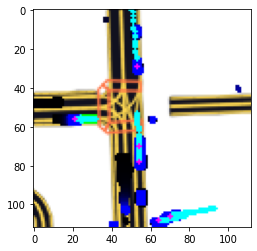

[[0.00198384 0.7830996  0.21491654]]
[[0.00221284 0.7815884  0.21619882]]
[[0.01853025 0.68721867 0.2942511 ]]
[[0.05774856 0.6098555  0.33239594]]
[[0.00285619 0.7705835  0.22656037]]
[[0.00569314 0.74190396 0.2524029 ]]
[[0.00133894 0.7965957  0.2020654 ]]
[[0.00159503 0.7904311  0.20797388]]


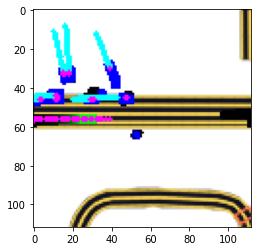

[[2.8487579e-08 9.6992368e-01 3.0076290e-02]]
[[0.01677016 0.693017   0.2902128 ]]
[[1.4303344e-04 8.5842955e-01 1.4142744e-01]]
[[0.05550241 0.6127639  0.3317337 ]]
[[1.9131369e-04 8.5158485e-01 1.4822389e-01]]


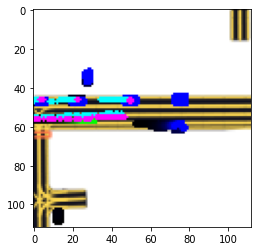

[[0.00294287 0.7698146  0.22724259]]
[[7.0186985e-08 9.6422166e-01 3.5778247e-02]]
[[7.0554306e-06 9.1555583e-01 8.4437102e-02]]


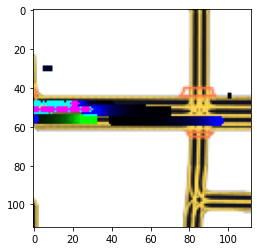

[[0.00191588 0.7832819  0.2148022 ]]
[[4.3802812e-11 9.9160415e-01 8.3958739e-03]]
[[0.0184998  0.68655866 0.2949415 ]]
[[0.03098387 0.656528   0.3124881 ]]


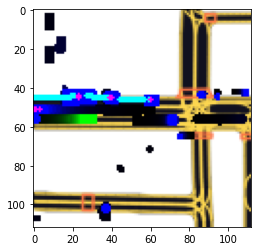

[[3.1025501e-04 8.3769220e-01 1.6199748e-01]]


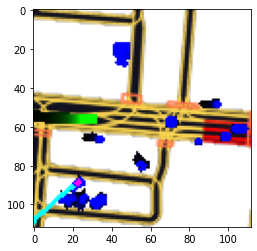

[[5.1310926e-04 8.2805568e-01 1.7143126e-01]]
[[4.1349340e-05 8.8649875e-01 1.1345993e-01]]
[[6.1274075e-04 8.2314569e-01 1.7624158e-01]]
[[2.1724371e-04 8.4912896e-01 1.5065384e-01]]
[[1.1964670e-04 8.6253613e-01 1.3734427e-01]]
[[5.8356451e-04 8.2337284e-01 1.7604357e-01]]
[[1.4373229e-04 8.5767001e-01 1.4218621e-01]]
[[4.7323001e-06 9.2168224e-01 7.8313030e-02]]
[[0.01370448 0.70216304 0.28413245]]
[[6.0326232e-07 9.4664514e-01 5.3354219e-02]]
[[1.175439e-06 9.388961e-01 6.110265e-02]]
[[4.9652263e-06 9.2135131e-01 7.8643717e-02]]


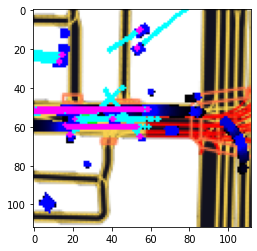

[[3.1123098e-04 8.4142435e-01 1.5826435e-01]]
[[0.00084106 0.8120563  0.18710262]]
[[7.093626e-06 9.151170e-01 8.487588e-02]]
[[1.3680183e-05 9.0571928e-01 9.4267011e-02]]
[[0.00889658 0.7244647  0.26663873]]
[[1.1234218e-04 8.6511308e-01 1.3477452e-01]]
[[1.7596185e-05 9.0106696e-01 9.8915428e-02]]
[[0.00186051 0.7856672  0.21247226]]
[[4.4007284e-06 9.2291898e-01 7.7076592e-02]]


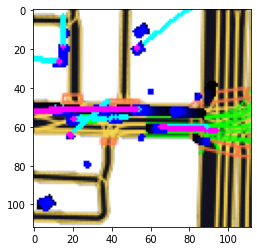

[[3.63771687e-05 8.88327301e-01 1.11636266e-01]]
[[1.6812065e-04 8.5575622e-01 1.4407563e-01]]
[[0.01388304 0.70307785 0.2830391 ]]
[[6.4416771e-04 8.1802058e-01 1.8133529e-01]]
[[3.2922739e-04 8.3876771e-01 1.6090311e-01]]


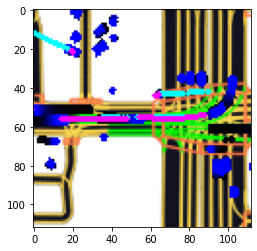

[[7.4807549e-04 8.1584620e-01 1.8340573e-01]]
[[6.4845686e-08 9.6498948e-01 3.5010532e-02]]
[[4.2026886e-04 8.3254957e-01 1.6703016e-01]]
[[0.03552328 0.64800787 0.3164688 ]]
[[0.00267562 0.7727446  0.22457978]]
[[5.4737717e-07 9.4693381e-01 5.3065665e-02]]
[[0.08869733 0.5705527  0.34074995]]
[[5.2951309e-05 8.8219929e-01 1.1774778e-01]]
[[3.5767534e-05 8.8745451e-01 1.1250971e-01]]


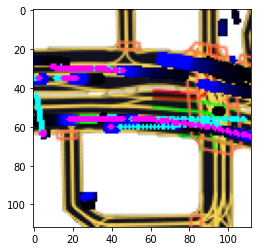

[[4.1211722e-04 8.3313483e-01 1.6645302e-01]]
[[4.5704155e-08 9.6727073e-01 3.2729182e-02]]
[[2.2057925e-06 9.3147844e-01 6.8519287e-02]]
[[8.9911598e-05 8.6849624e-01 1.3141385e-01]]
[[2.2179056e-06 9.3111318e-01 6.8884633e-02]]


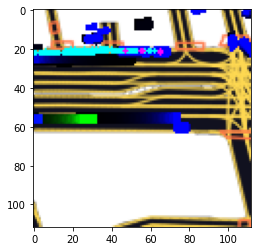

[[3.545216e-06 9.252599e-01 7.473657e-02]]
[[4.1877987e-10 9.8693860e-01 1.3061364e-02]]


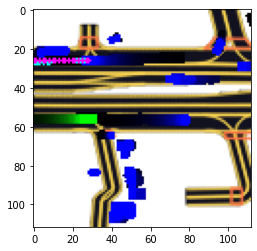

[[1.9281772e-04 8.5186124e-01 1.4794600e-01]]
[[0.00145593 0.79483014 0.20371395]]
[[0.00182599 0.7866451  0.21152893]]
[[1.1281348e-06 9.3915820e-01 6.0840700e-02]]
[[1.7357035e-05 9.0118814e-01 9.8794520e-02]]
[[4.8669699e-07 9.4872916e-01 5.1270325e-02]]
[[8.7004926e-05 8.6930293e-01 1.3061008e-01]]


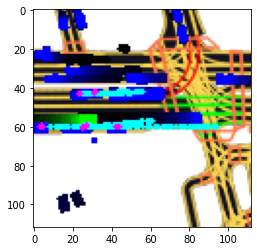

[[9.5162995e-06 9.1068083e-01 8.9309685e-02]]
[[5.2566833e-07 9.4728750e-01 5.2711997e-02]]
[[6.1455789e-06 9.1818136e-01 8.1812464e-02]]
[[5.0509874e-10 9.8634028e-01 1.3659675e-02]]
[[6.1351882e-11 9.9098045e-01 9.0194773e-03]]
[[5.6513983e-08 9.6547312e-01 3.4526814e-02]]
[[6.8013019e-06 9.1517568e-01 8.4817596e-02]]


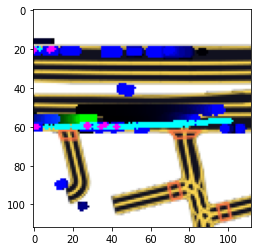

[[0.00959891 0.7207126  0.2696885 ]]
[[1.5229073e-11 9.9312967e-01 6.8703569e-03]]
[[0.00092327 0.8071873  0.19188944]]
[[1.4824472e-07 9.5784825e-01 4.2151574e-02]]
[[9.022529e-06 9.115353e-01 8.845568e-02]]
[[7.1801282e-10 9.8540318e-01 1.4596811e-02]]
[[0.01347283 0.7039089  0.28261822]]
[[0.00317405 0.76752716 0.22929883]]
[[0.00306365 0.7660811  0.23085527]]
[[2.8827912e-04 8.3920389e-01 1.6050787e-01]]


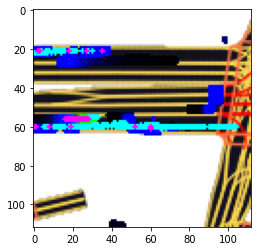

In [13]:
multi_vis = True
cvae.eval()
torch.set_grad_enabled(False)

# build a dict to retrieve future trajectories from GT
gt_rows = {}
for row in read_gt_csv(eval_gt_path):
    gt_rows[row["track_id"] + row["timestamp"]] = row["coord"]

eval_ego_dataset = EgoDataset(cfg, eval_zarr, rasterizer)
eval_dataset = AgentDataset(cfg, eval_zarr, rasterizer)

for frame_number in range(99, len(eval_zarr.frames), 100):  # start from last frame of scene_0 and increase by 100
    agent_indices = eval_dataset.get_frame_indices(frame_number) 
    if not len(agent_indices):
        continue

    # get AV point-of-view frame
    data_ego = eval_ego_dataset[frame_number]
    im_ego = rasterizer.to_rgb(data_ego["image"].transpose(1, 2, 0))
    center = np.asarray(cfg["raster_params"]["ego_center"]) * cfg["raster_params"]["raster_size"]
    
    predicted_positions = []
    predicted_positions1 = []
    predicted_positions2 = []
    predicted_positions3 = []
    target_positions = []

    if multi_vis == True:
        for v_index in agent_indices:
            data_agent = eval_dataset[v_index]
            out_net,confs,_,_,_,_ = cvae(data_agent)
            confs = confs.detach().cpu().numpy()
            print(confs)
            out_net1 = out_net[0][0]
            out_net2 = out_net[0][1]
            out_net3 = out_net[0][2]
            out_pos1 = out_net.reshape(-1, 2).detach().cpu().numpy()
            out_pos2 = out_net.reshape(-1, 2).detach().cpu().numpy()
            out_pos3 = out_net.reshape(-1, 2).detach().cpu().numpy()
            # store absolute world coordinates
            predicted_positions1.append(transform_points(out_pos1, data_agent["world_from_agent"]))
            predicted_positions2.append(transform_points(out_pos2, data_agent["world_from_agent"]))
            predicted_positions3.append(transform_points(out_pos3, data_agent["world_from_agent"]))
            # retrieve target positions from the GT and store as absolute coordinates
            track_id, timestamp = data_agent["track_id"], data_agent["timestamp"]
            target_positions.append(gt_rows[str(track_id) + str(timestamp)] + data_agent["centroid"][:2])


        # convert coordinates to AV point-of-view so we can draw them
        predicted_positions1 = transform_points(np.concatenate(predicted_positions1), data_ego["raster_from_world"])
        predicted_positions2 = transform_points(np.concatenate(predicted_positions2), data_ego["raster_from_world"])
        predicted_positions3 = transform_points(np.concatenate(predicted_positions3), data_ego["raster_from_world"])
        target_positions = transform_points(np.concatenate(target_positions), data_ego["raster_from_world"])

        draw_trajectory(im_ego, predicted_positions1, (34,222,79))
        draw_trajectory(im_ego, predicted_positions2, (220,235,21))
        draw_trajectory(im_ego, predicted_positions3, PREDICTED_POINTS_COLOR)
        draw_trajectory(im_ego, target_positions, TARGET_POINTS_COLOR)

        plt.imshow(im_ego)
        plt.show()

    else:
        for v_index in agent_indices:
            data_agent = eval_dataset[v_index]
            out_net,confs,_,_,_,_ = cvae(data_agent)
            confs = confs.detach().cpu().numpy()
    #         print(confs)
            out_net = out_net[0][np.argmax(confs)]
            out_pos = out_net.reshape(-1, 2).detach().cpu().numpy()
            # store absolute world coordinates
            predicted_positions.append(transform_points(out_pos, data_agent["world_from_agent"]))
            # retrieve target positions from the GT and store as absolute coordinates
            track_id, timestamp = data_agent["track_id"], data_agent["timestamp"]
            target_positions.append(gt_rows[str(track_id) + str(timestamp)] + data_agent["centroid"][:2])


        # convert coordinates to AV point-of-view so we can draw them
        predicted_positions = transform_points(np.concatenate(predicted_positions), data_ego["raster_from_world"])
        target_positions = transform_points(np.concatenate(target_positions), data_ego["raster_from_world"])

        draw_trajectory(im_ego, target_positions, TARGET_POINTS_COLOR)
        draw_trajectory(im_ego, predicted_positions, PREDICTED_POINTS_COLOR)


        plt.imshow(im_ego)
        plt.show()